<h1>Siamese Networks</h1>

In [ ]:
import random
import PIL.ImageOps

from PIL import Image

import matplotlib.pyplot as plt
import numpy as np
import torchvision
import torchvision.datasets as datasets
import torchvision.transforms as transforms
import torchvision.utils
import torch
import torch.nn as nn
import torch.nn.functional as F

from torch.autograd import Variable
from torch import optim
from torch.utils.data import DataLoader, Dataset
import os
from tqdm.autonotebook import tqdm

import seaborn as sns
from sklearn.manifold import TSNE
import pandas as pd

In [2]:
%matplotlib inline

In [3]:
torch.manual_seed(0)

In [4]:
device = (
    torch.device("cpu") if not torch.cuda.is_available() else torch.device("cuda:0")
)
print("Using device", device)

Using device cuda:0


In [5]:
cwd = os.getcwd()
data_directory = os.path.join(cwd, "data")
docs_dir = os.path.join(cwd, "docs")
docs_double_siamese = os.path.join(docs_dir, "doubleSiamese")
docs_triple_siamese = os.path.join(docs_dir, "tripleSiamese")

In [6]:
# !wget https://github.com/maticvl/dataHacker/raw/master/DATA/at%26t.zip
# !rm -rf data
# !unzip "at&t.zip" -d .

In [7]:
def imshow(img, text=None):
    npimg = img.numpy()
    plt.axis("off")
    if text:
        plt.text(
            75,
            8,
            text,
            style="italic",
            fontweight="bold",
            bbox={"facecolor": "white", "alpha": 0.8, "pad": 10},
        )

    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()


def show_plot(iteration, loss, savefig=False, n_epochs=0, lr=0, save_dir=docs_dir):
    fig, ax = plt.subplots(figsize=(20, 10))
    ax.set_title(f"Loss through iterations, epochs: {n_epochs}, lr: {lr}")
    ax.set_xlabel("Iteration")
    ax.set_ylabel("Value")
    ax.plot(iteration, loss)
    if savefig:
        fig.savefig(
            os.path.join(save_dir, f"training_loss_e{n_epochs}_lr{lr}.png"), dpi=300
        )
    plt.show()

<h2>Dataset class declaration</h2>

In [8]:
class SiameseNetworkDataset(Dataset):
    def __init__(self, imageFolderDataset, transform=None):
        self.imageFolderDataset = imageFolderDataset
        self.transform = transform

    def __getitem__(self, index):
        img0_tuple = random.choice(self.imageFolderDataset.imgs)

        # Potrzebujemy mniej więcej połowę par podobnych obrazków
        should_get_same_class = random.randint(0, 1)
        if should_get_same_class:
            while True:
                # Wyszukiwanie zdjęcia tej samej osoby
                img1_tuple = random.choice(self.imageFolderDataset.imgs)
                if img0_tuple[1] == img1_tuple[1]:
                    break
        else:
            while True:
                # Wyszukiwanie zdjęcia innej  osoby
                img1_tuple = random.choice(self.imageFolderDataset.imgs)
                if img0_tuple[1] != img1_tuple[1]:
                    break

        img0 = Image.open(img0_tuple[0])
        img1 = Image.open(img1_tuple[0])

        img0 = img0.convert("L")
        img1 = img1.convert("L")

        if self.transform is not None:
            img0 = self.transform(img0)
            img1 = self.transform(img1)

        return (
            img0,
            img1,
            torch.from_numpy(
                np.array([int(img1_tuple[1] != img0_tuple[1])], dtype=np.float32)
            ),
        )

    def __len__(self):
        return len(self.imageFolderDataset.imgs)

<h2>Data Imread</h2>

In [9]:
# Wczytanie zbioru danych

folder_dataset = datasets.ImageFolder(
    root=f'{os.path.join(data_directory, "faces", "training")}'
)

# Zmiana rozmiaru próbek i konwersja na tensor
transformation = transforms.Compose(
    [transforms.Resize((100, 100)), transforms.ToTensor()]
)

# Inicjalizacja klasy obsługującej zbiór danych
siamese_dataset = SiameseNetworkDataset(
    imageFolderDataset=folder_dataset, transform=transformation
)

<h2>Sample data</h2>

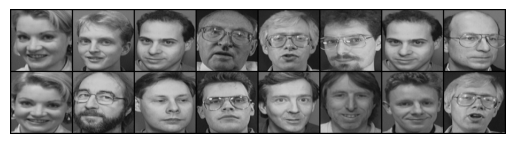

[0. 1. 1. 1. 1. 1. 1. 1.]


In [10]:
# Inicjalizacja klasy obsługującej zbiór danych
vis_dataloader = DataLoader(
    siamese_dataset,
    shuffle=True,
    # num_workers=2,
    batch_size=8,
)

# Ekstrakcja pierwszego pakietu danych
example_batch = next(iter(vis_dataloader))

# Pojedynczy pakiet danych zawiera tablicę zdjęć o rozmiarze 2 x 8 oraz etykietę
# Jeżeli etykieta jest równa 1 oznacza to, że para zdjęć nie przedstawia tej samej osoby.
# Jeżeli etykieta jest równa 0 oznacza to, że para zdjęć przedstawia tę samą osobę
concatenated = torch.cat((example_batch[0], example_batch[1]), 0)

imshow(torchvision.utils.make_grid(concatenated))
print(example_batch[2].numpy().reshape(-1))

<h2>Basic Siamese Network implementation<h2>

In [11]:
class SiameseNetwork(nn.Module):
    def __init__(self):
        super(SiameseNetwork, self).__init__()

        self.cnn1 = nn.Sequential(
            nn.Conv2d(1, 96, kernel_size=11, stride=4),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(3, stride=2),
            nn.Conv2d(96, 256, kernel_size=5, stride=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2, stride=2),
            nn.Conv2d(256, 384, kernel_size=3, stride=1),
            nn.ReLU(inplace=True),
        )

        self.fc1 = nn.Sequential(
            nn.Linear(384, 1024),
            nn.ReLU(inplace=True),
            nn.Linear(1024, 256),
            nn.ReLU(inplace=True),
            nn.Linear(256, 2),
        )

    def forward_once(self, x):
        # Funkcja zostanie wywołana osobno dla każdej próbki
        # Jej wyjście zostanie wykorzystane w celu określenia odległości
        output = self.cnn1(x)
        output = output.view(output.size()[0], -1)
        output = self.fc1(output)
        return output

    def forward(self, input1, input2):
        # Funkcja przyjmuje obie próbki i zwraca parę wektorów
        output1 = self.forward_once(input1)
        output2 = self.forward_once(input2)

        return output1, output2

<h2>Contrastive loss declaration</h2>

In [12]:
class ContrastiveLoss(torch.nn.Module):
    def __init__(self, margin=2.0):
        super(ContrastiveLoss, self).__init__()
        self.margin = margin

    def forward(self, output1, output2, label):
        euclidean_distance = F.pairwise_distance(output1, output2, keepdim=True)

        loss_contrastive = torch.mean(
            (1 - label) * torch.pow(euclidean_distance, 2)
            + label
            * torch.pow(torch.clamp(self.margin - euclidean_distance, min=0.0), 2)
        )

        return loss_contrastive

<h2></h2>

<h2>Training data imread</h2>

In [13]:
train_dataloader = DataLoader(
    siamese_dataset,
    shuffle=True,
    # num_workers=8,
    batch_size=64,
)

<h2>Przykładowa pętla ucząca</h2>

In [14]:
def fit(
    model,
    criterion,
    optimizer,
    train_dl,
    n_epochs=100,
    lr=0.0005,
    savefig=False,
    verbose=True,
):
    counter = []
    loss_history = []
    iteration_number = 0
    model.train()
    for epoch in tqdm(range(n_epochs), desc="Epoch", colour="magenta"):
        for i, (img0, img1, label) in enumerate(train_dl, 0):
            img0, img1, label = img0.to(device), img1.to(device), label.to(device)

            optimizer.zero_grad()

            output1, output2 = model(img0, img1)

            loss_contrastive = criterion(output1, output2, label)

            loss_contrastive.backward()

            optimizer.step()

            if i % 10 == 0:
                if verbose:
                    print(
                        f"Epoch number {epoch}\n Current loss {loss_contrastive.item()}\n"
                    )
                iteration_number += 10

                counter.append(iteration_number)
                loss_history.append(loss_contrastive.item())

    show_plot(
        counter,
        loss_history,
        lr=lr,
        savefig=savefig,
        n_epochs=n_epochs,
        save_dir=docs_double_siamese,
    )

Epoch:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch number 0
 Current loss 1.99753999710083
Epoch number 1
 Current loss 0.6519716382026672
Epoch number 2
 Current loss 0.7453104257583618
Epoch number 3
 Current loss 0.9103308916091919
Epoch number 4
 Current loss 0.7484378814697266
Epoch number 5
 Current loss 0.8651232719421387
Epoch number 6
 Current loss 0.5787425637245178
Epoch number 7
 Current loss 0.4813387393951416
Epoch number 8
 Current loss 0.7949724197387695
Epoch number 9
 Current loss 0.9459370374679565
Epoch number 10
 Current loss 0.7176153659820557
Epoch number 11
 Current loss 0.6669294834136963
Epoch number 12
 Current loss 0.6387780904769897
Epoch number 13
 Current loss 0.5722020268440247
Epoch number 14
 Current loss 0.5004037022590637
Epoch number 15
 Current loss 0.5089507699012756
Epoch number 16
 Current loss 0.5962153673171997
Epoch number 17
 Current loss 0.44001126289367676
Epoch number 18
 Current loss 0.6642880439758301
Epoch number 19
 Current loss 0.4285157322883606
Epoch number 20
 Current loss 0

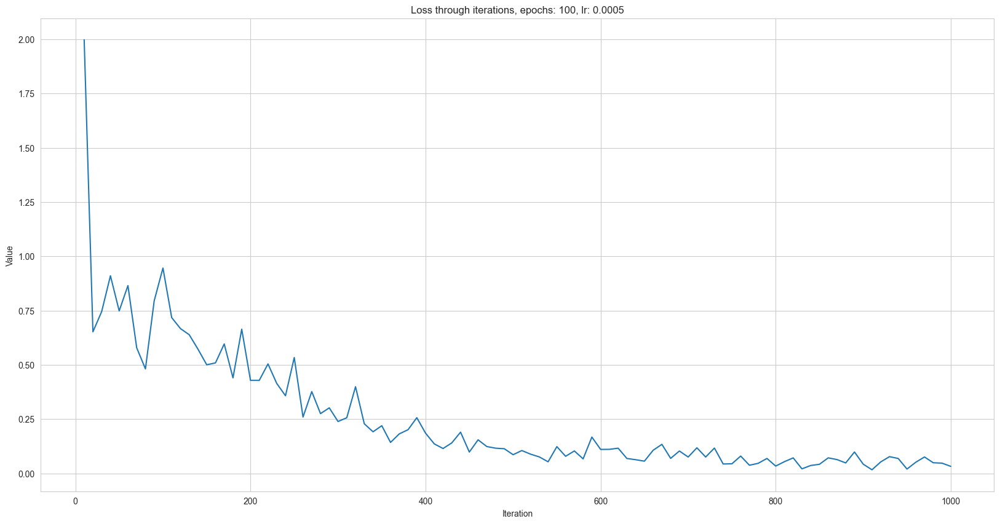

In [15]:
net = SiameseNetwork().to(device)
criterion_func = ContrastiveLoss()
optimizer = optim.Adam(net.parameters(), lr=0.0005)

fit(
    model=net,
    criterion=criterion_func,
    optimizer=optimizer,
    train_dl=train_dataloader,
    n_epochs=100,
    lr=0.0005,
    savefig=True,
    verbose=True,
)

# Lr analysis

Learning rate analysis:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch:   0%|          | 0/100 [00:00<?, ?it/s]

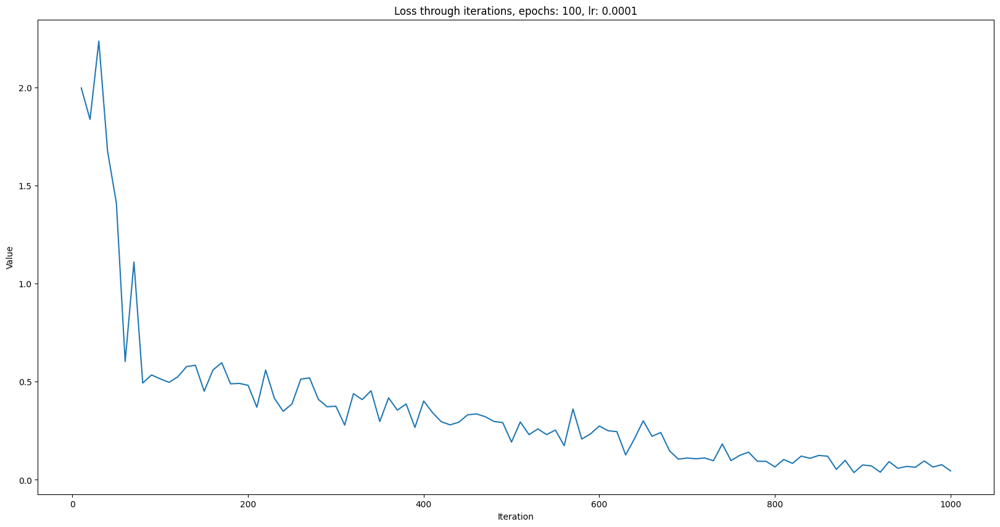

Epoch:   0%|          | 0/100 [00:00<?, ?it/s]

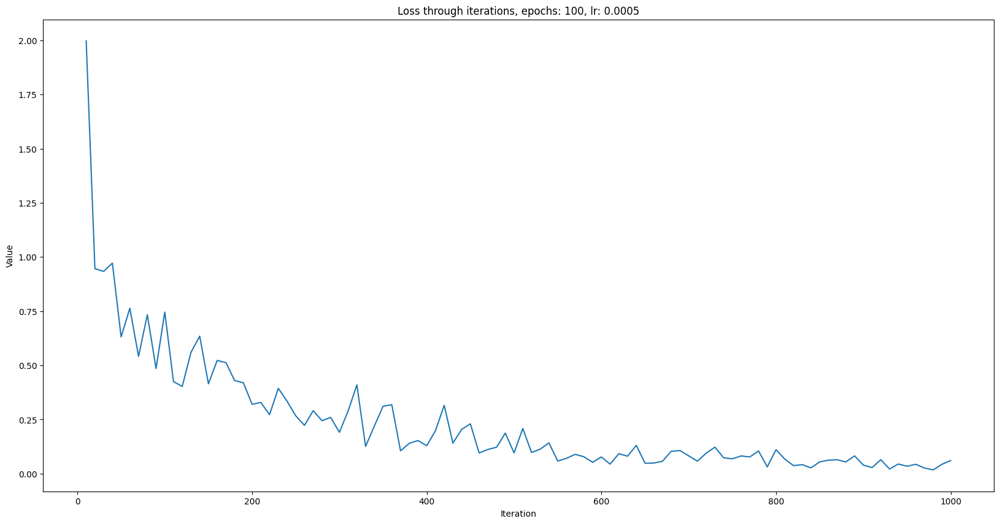

Epoch:   0%|          | 0/100 [00:00<?, ?it/s]

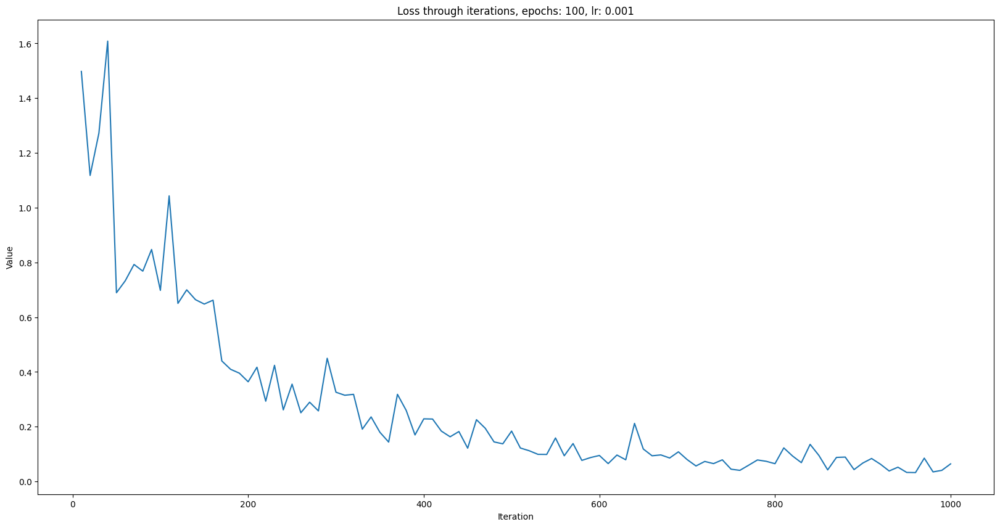

Epoch:   0%|          | 0/100 [00:00<?, ?it/s]

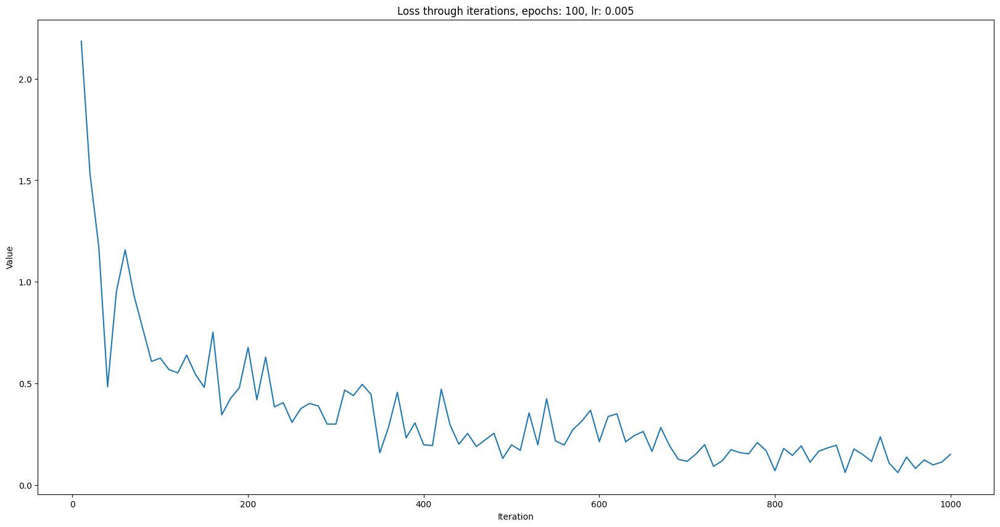

Epoch:   0%|          | 0/100 [00:00<?, ?it/s]

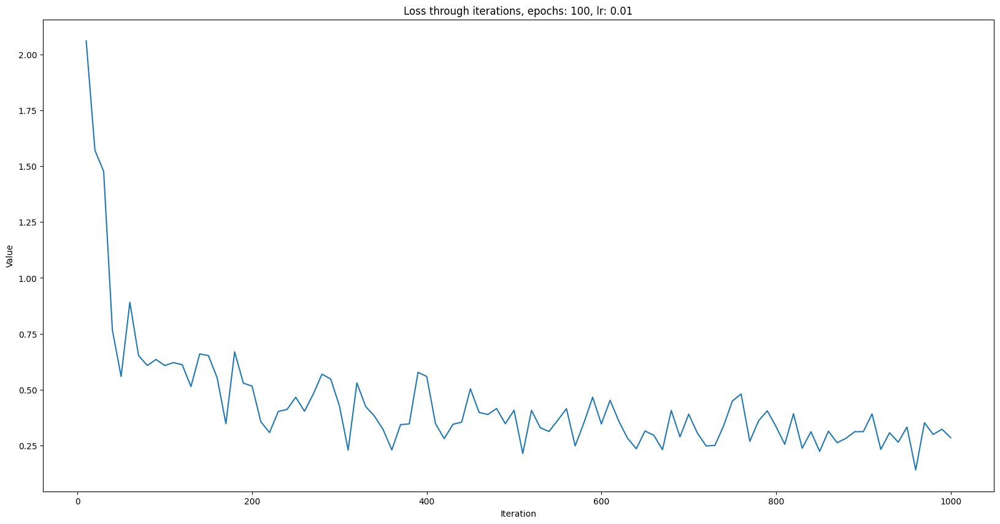

Epoch:   0%|          | 0/100 [00:00<?, ?it/s]

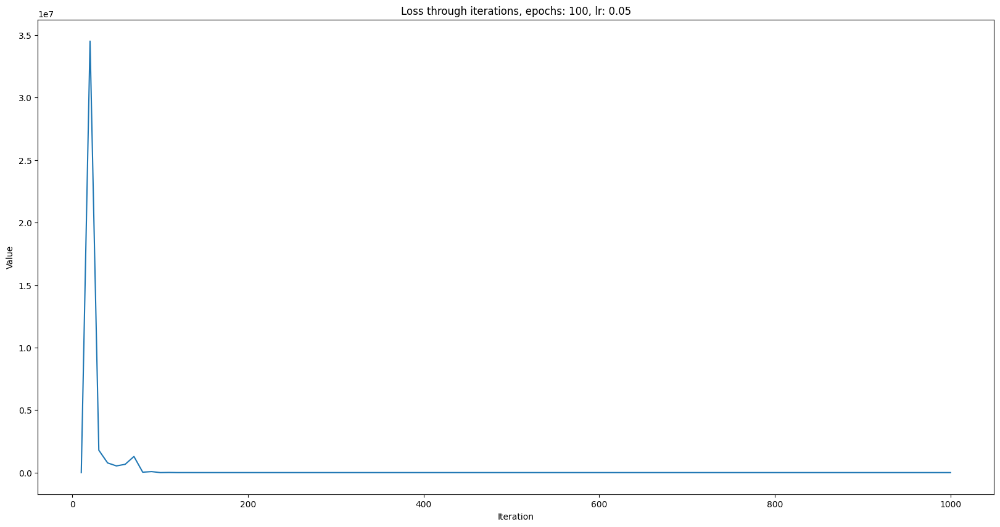

Epoch:   0%|          | 0/100 [00:00<?, ?it/s]

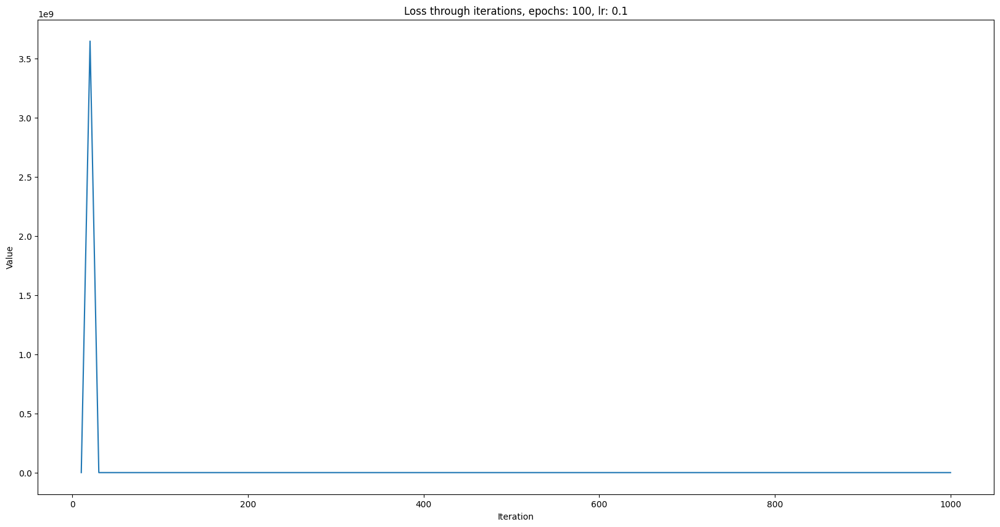

Epoch:   0%|          | 0/100 [00:00<?, ?it/s]

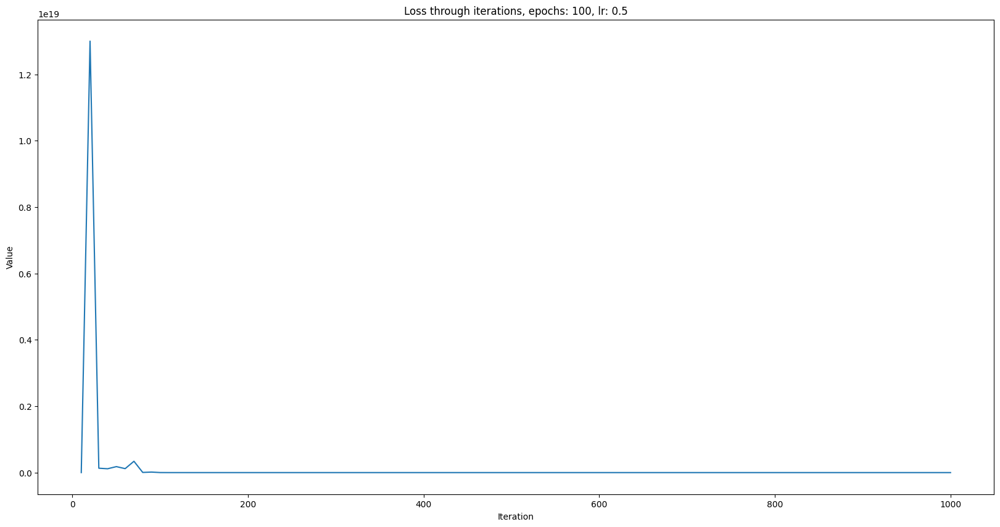

Epoch:   0%|          | 0/100 [00:00<?, ?it/s]

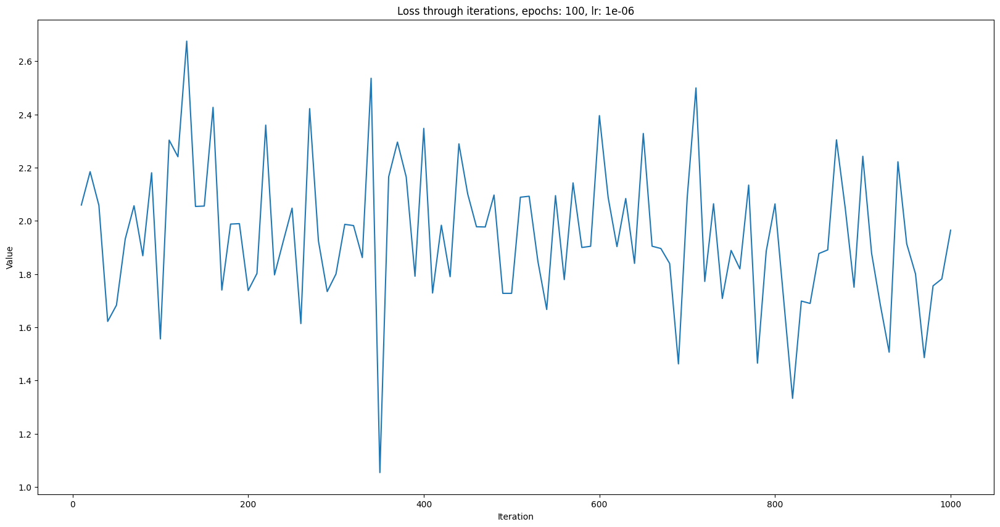

In [34]:
lr_array = [0.0001, 0.0005, 0.001, 0.005, 0.01, 0.05, 0.1, 0.5, 0.000001]
model_array = [SiameseNetwork().to(device) for i in range(len(lr_array))]

for idx, lr in tqdm(
    enumerate(lr_array),
    desc="Learning rate analysis",
    total=len(lr_array),
    colour="yellow",
):
    model_siamese = model_array[idx]
    criterion_f = ContrastiveLoss()
    optimizer = optim.Adam(model_siamese.parameters(), lr=lr)
    fit(
        model=model_siamese,
        criterion=criterion_f,
        optimizer=optimizer,
        train_dl=train_dataloader,
        n_epochs=100,
        lr=lr,
        savefig=True,
        verbose=False,
    )

# Epochs analysis

N epochs analysis:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch:   0%|          | 0/2 [00:00<?, ?it/s]

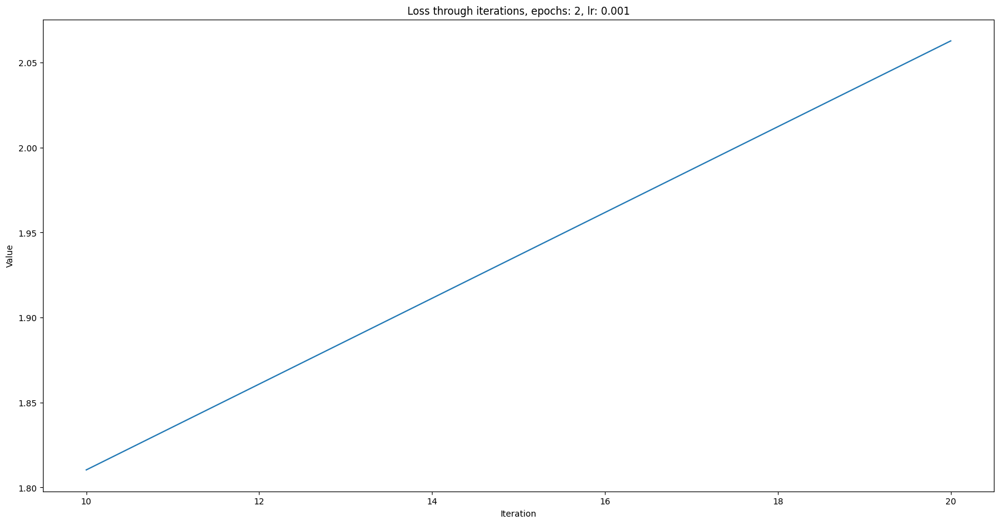

Epoch:   0%|          | 0/10 [00:00<?, ?it/s]

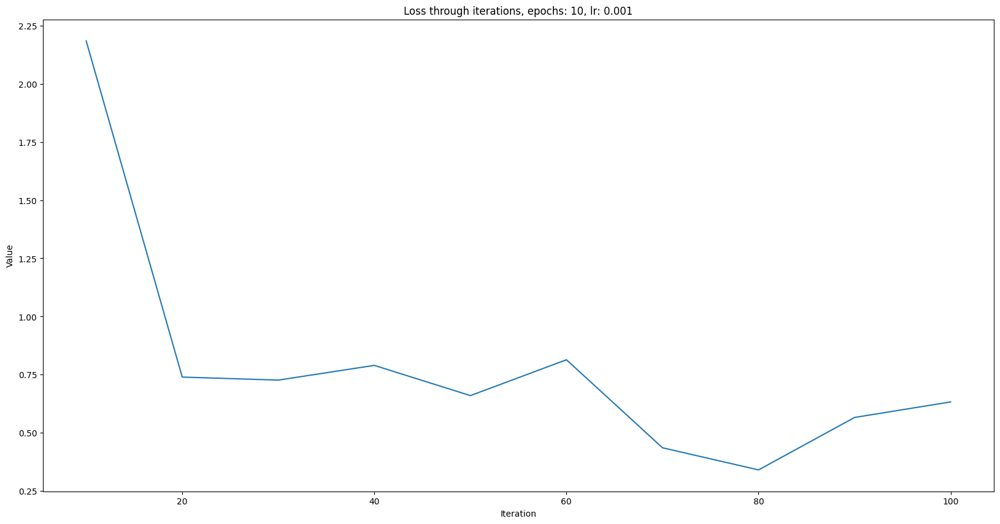

Epoch:   0%|          | 0/20 [00:00<?, ?it/s]

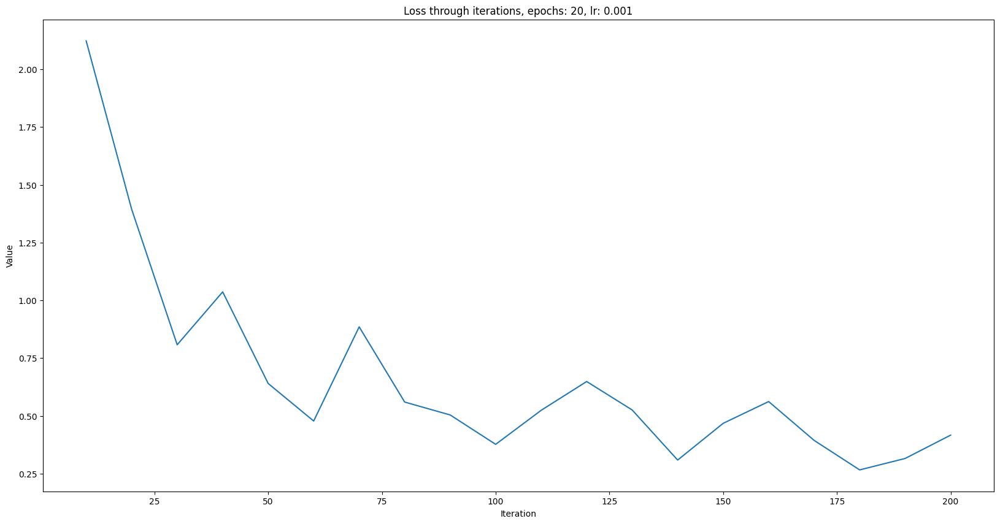

Epoch:   0%|          | 0/30 [00:00<?, ?it/s]

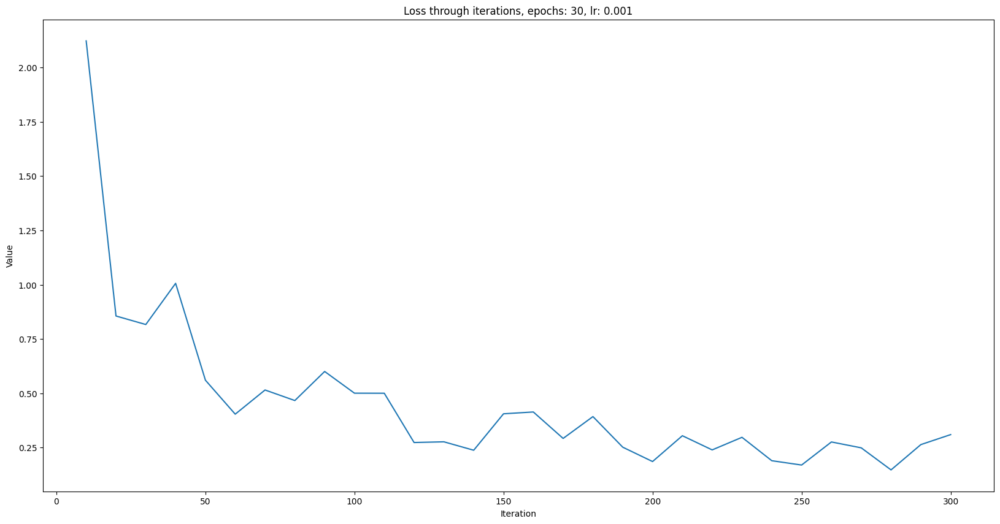

Epoch:   0%|          | 0/50 [00:00<?, ?it/s]

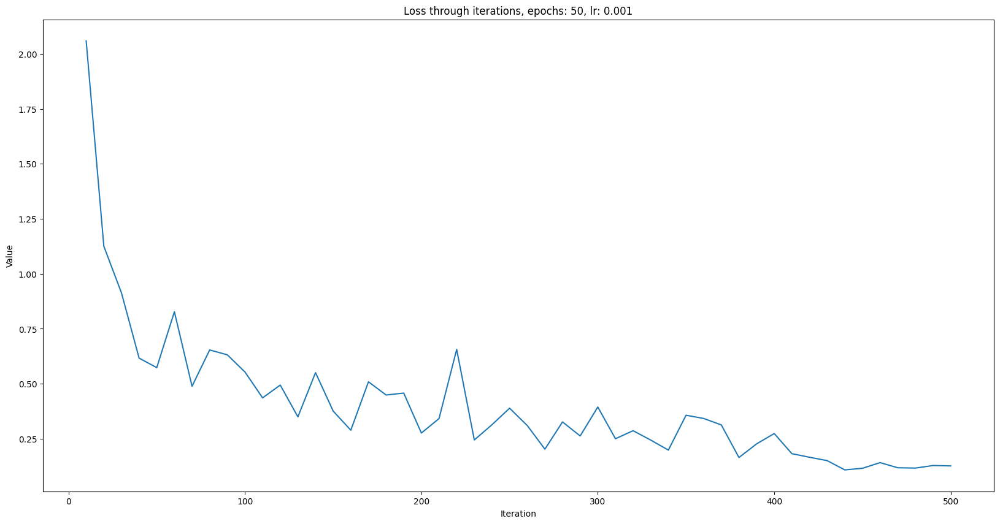

Epoch:   0%|          | 0/70 [00:00<?, ?it/s]

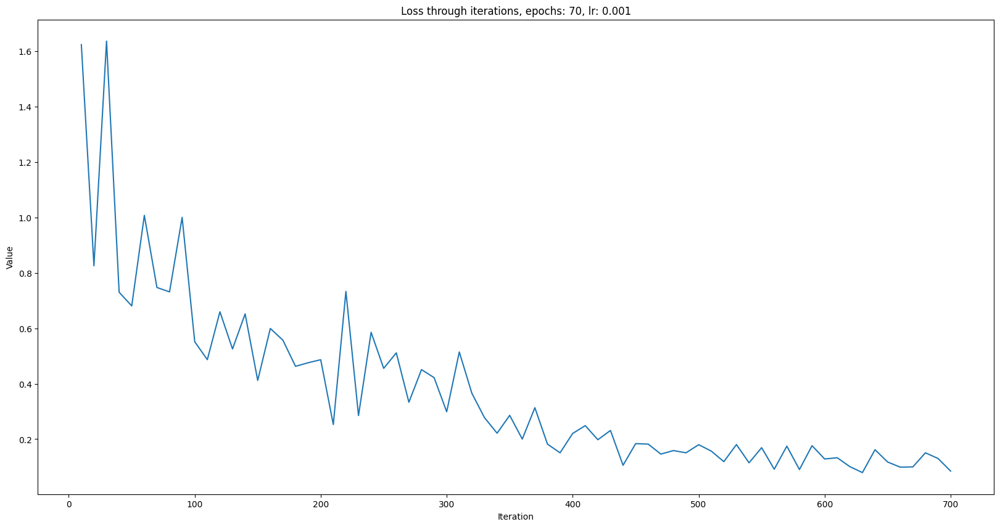

Epoch:   0%|          | 0/100 [00:00<?, ?it/s]

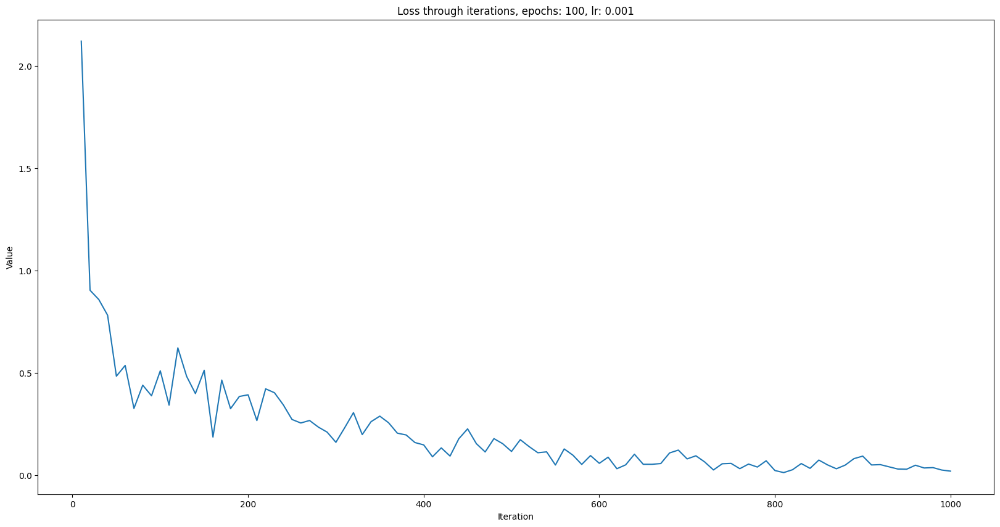

Epoch:   0%|          | 0/300 [00:00<?, ?it/s]

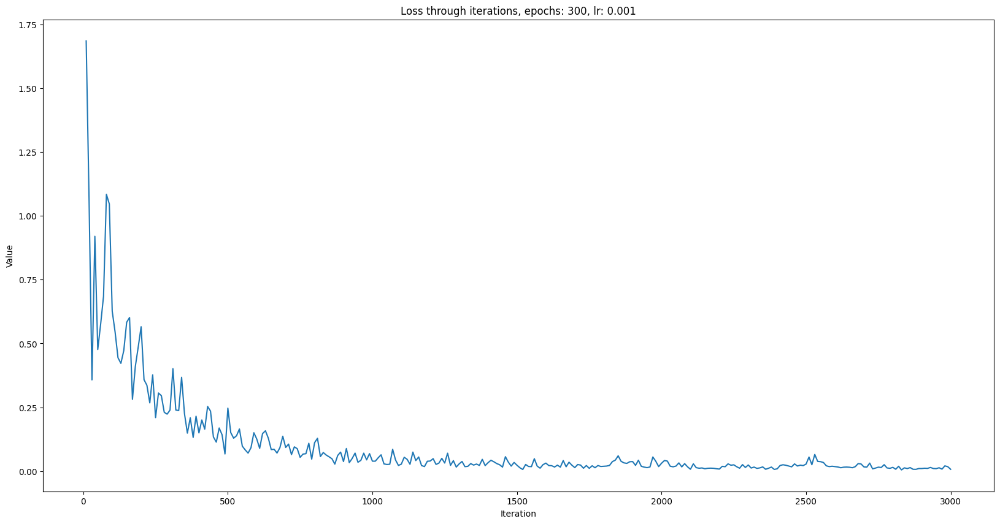

In [43]:
epochs_array = [2, 10, 20, 30, 50, 70, 100, 300]
model_epochs_array = [SiameseNetwork().to(device) for i in range(len(epochs_array))]

for idx, n_epochs in tqdm(
    enumerate(epochs_array),
    desc="N epochs analysis",
    total=len(epochs_array),
    colour="yellow",
):
    model_siamese = model_epochs_array[idx]
    criterion_f = ContrastiveLoss()
    optimizer = optim.Adam(model_siamese.parameters(), lr=0.001)
    fit(
        model=model_siamese,
        criterion=criterion_f,
        optimizer=optimizer,
        train_dl=train_dataloader,
        n_epochs=n_epochs,
        lr=0.001,
        savefig=True,
        verbose=False,
    )

<h2>Przykładowa funkcja służąca do ewaluacji sieci dwójkowej</h2>

In [21]:
folder_dataset_test = datasets.ImageFolder(
    root=f'{os.path.join(data_directory, "faces", "testing")}'
)
siamese_dataset = SiameseNetworkDataset(
    imageFolderDataset=folder_dataset_test, transform=transformation
)
test_dataloader = DataLoader(
    siamese_dataset,
    # num_workers=2,
    batch_size=1,
    shuffle=True,
)

In [56]:
def evaluate_according_to_first_img(model, n_compare_images=5):
    dataiter = iter(test_dataloader)
    x0, _, _ = next(dataiter)

    for i in range(n_compare_images):
        _, x1, label2 = next(dataiter)
        concatenated = torch.cat((x0, x1), 0)

        output1, output2 = model(x0.to(device), x1.to(device))
        euclidean_distance = F.pairwise_distance(output1, output2)
        imshow(
            torchvision.utils.make_grid(concatenated),
            f"Dissimilarity: {euclidean_distance.item():.2f}",
        )

Model with learning rate: 0.0001


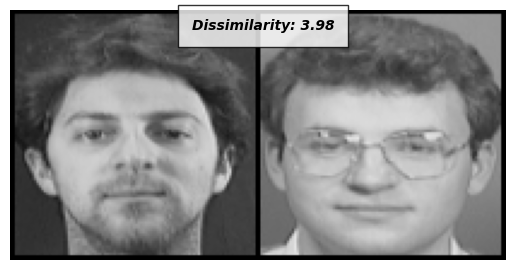

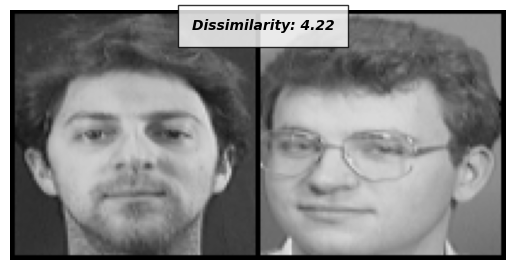

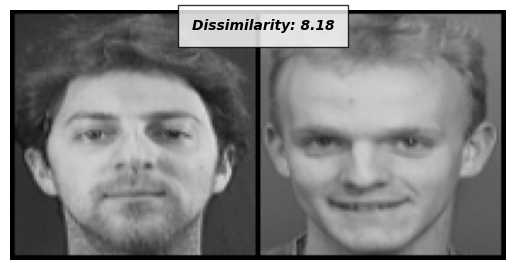

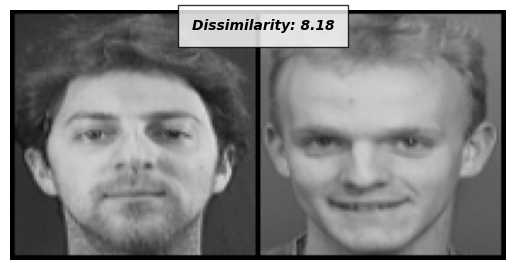

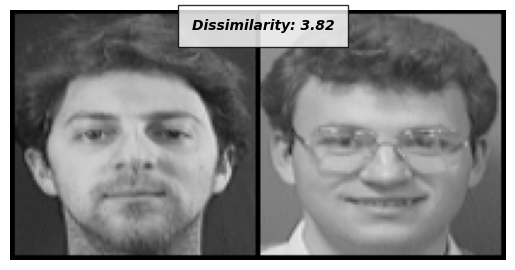

Model with learning rate: 0.0005


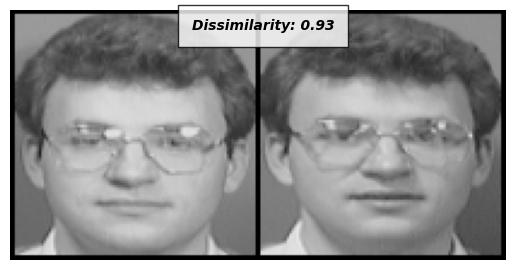

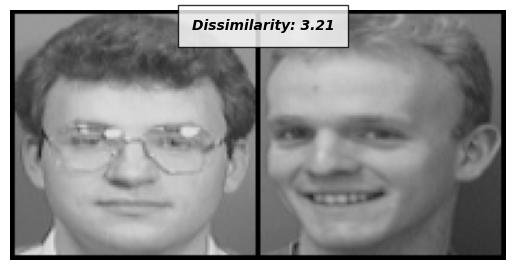

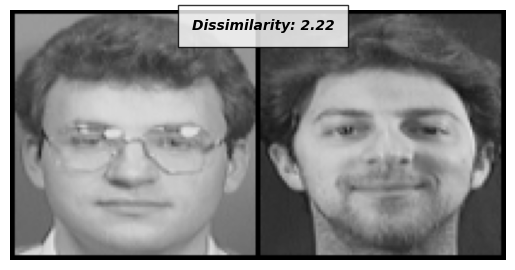

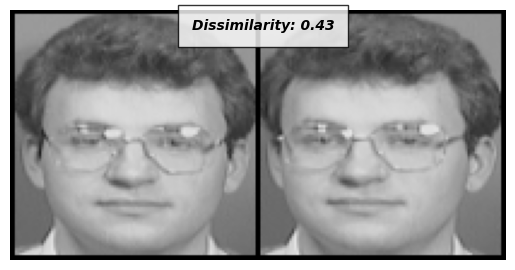

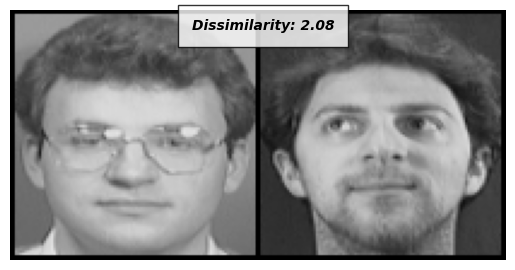

Model with learning rate: 0.001


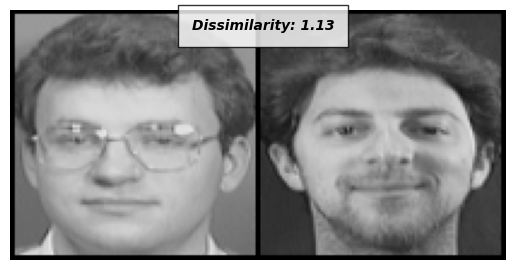

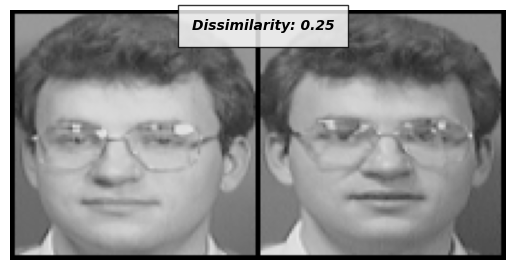

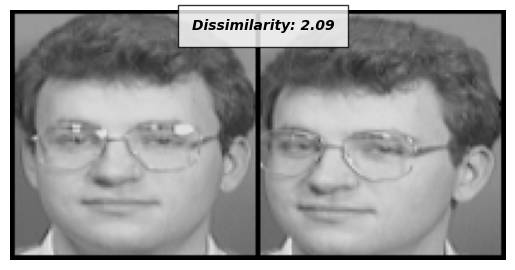

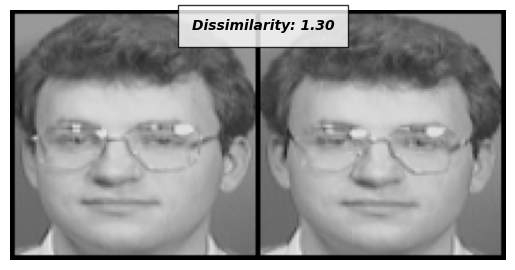

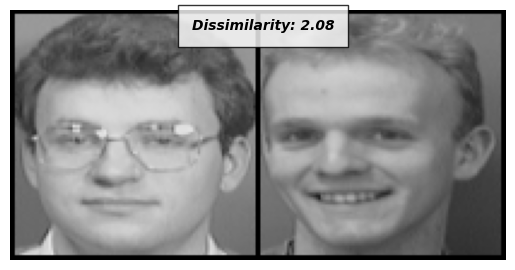

Model with learning rate: 0.005


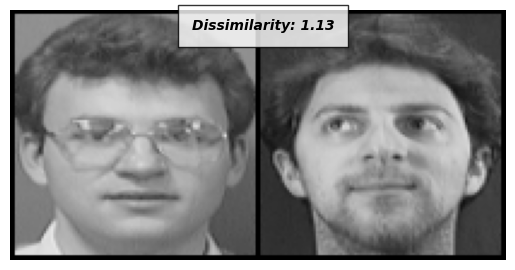

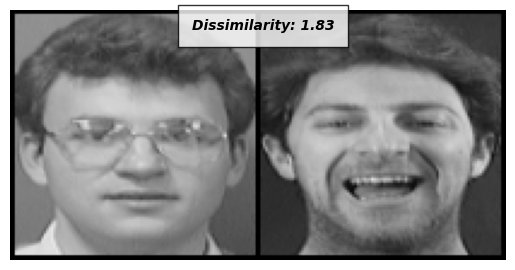

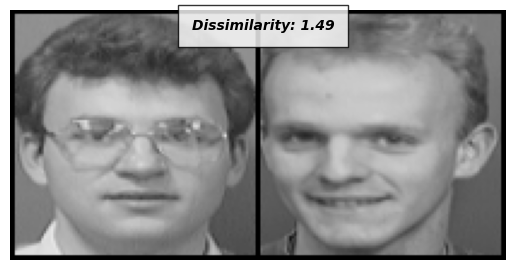

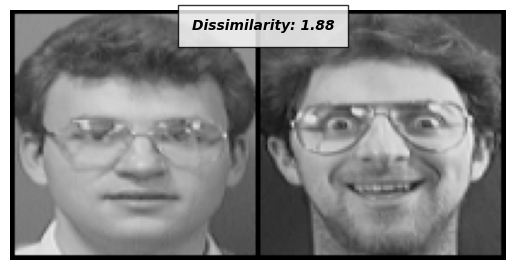

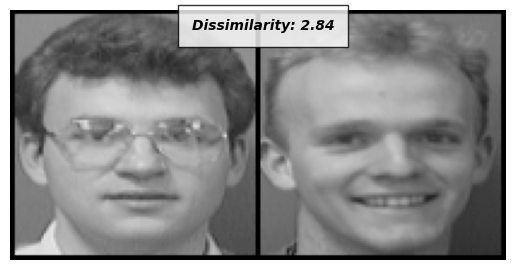

Model with learning rate: 0.01


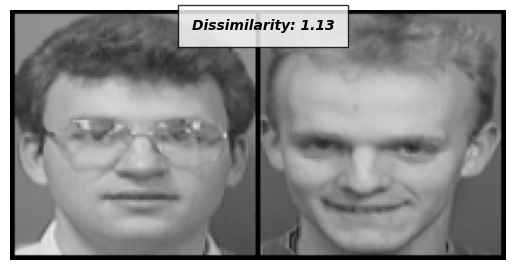

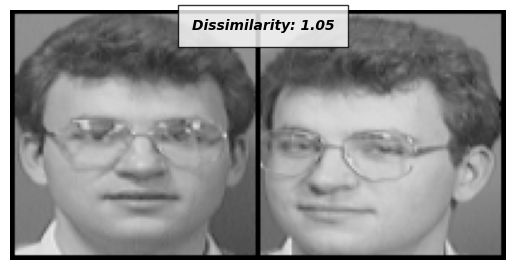

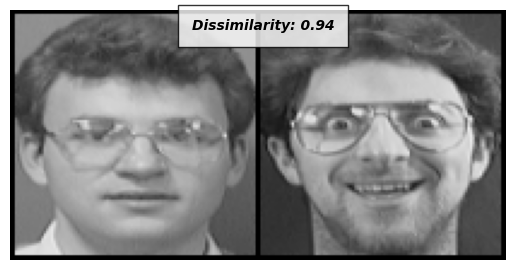

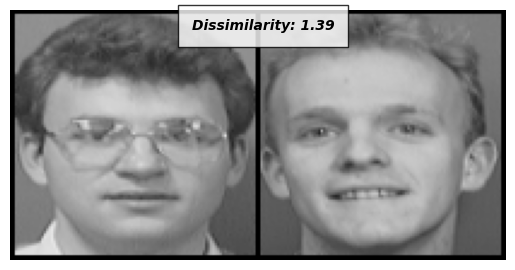

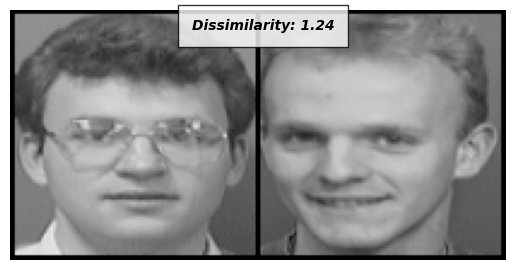

Model with learning rate: 0.05


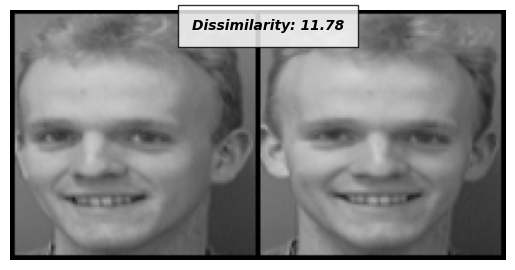

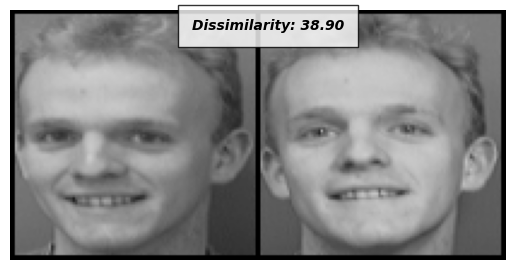

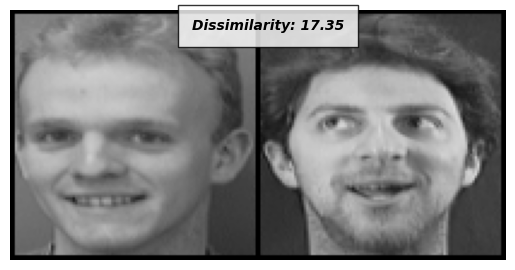

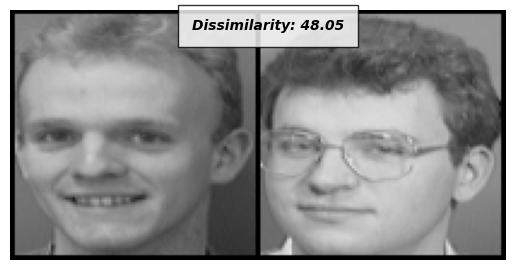

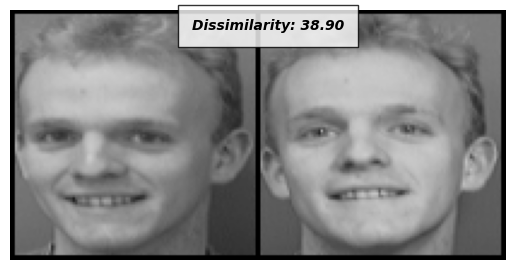

Model with learning rate: 0.1


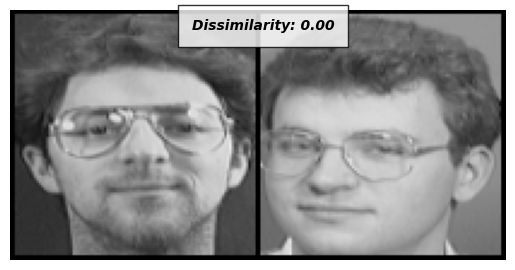

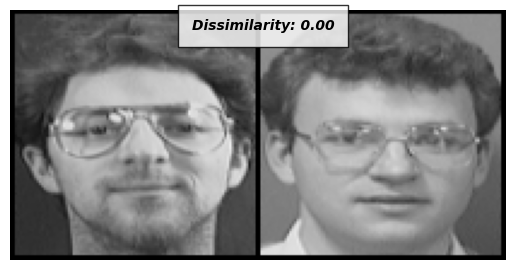

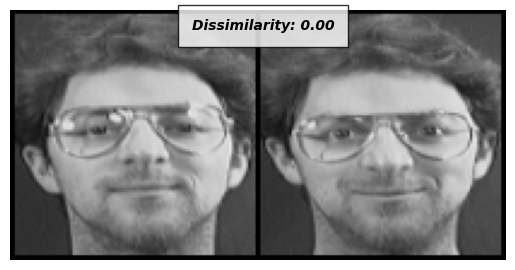

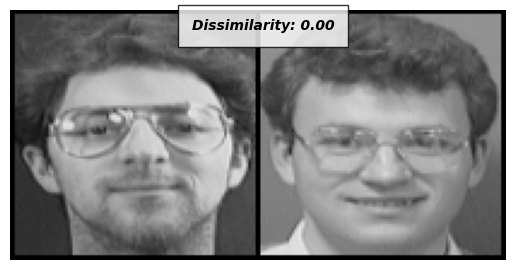

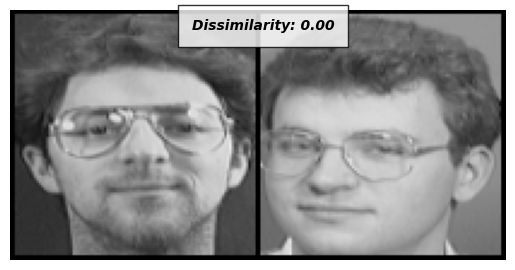

Model with learning rate: 0.5


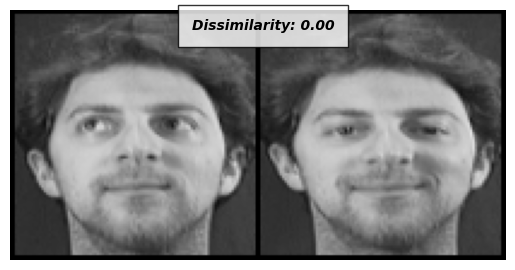

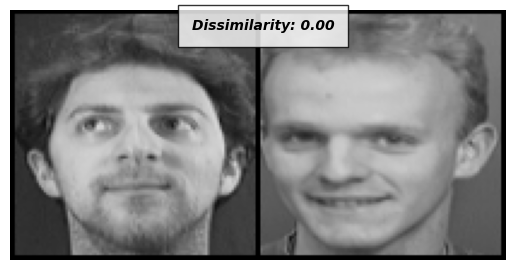

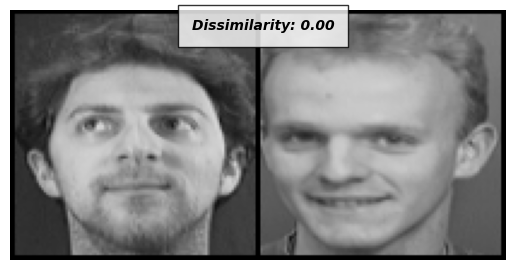

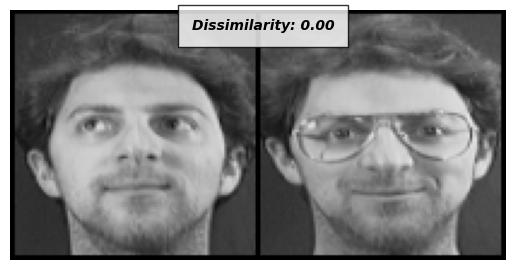

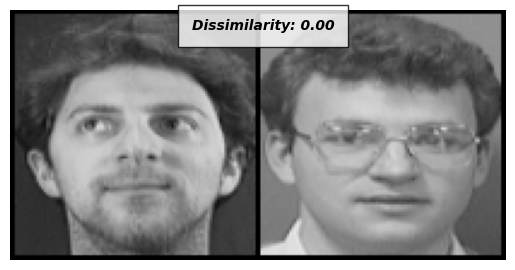

Model with learning rate: 1e-06


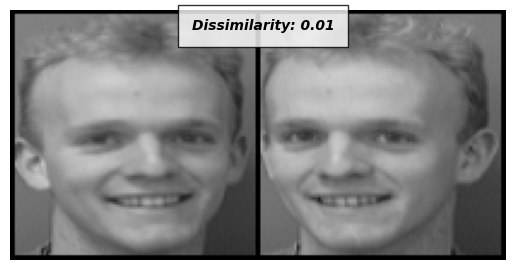

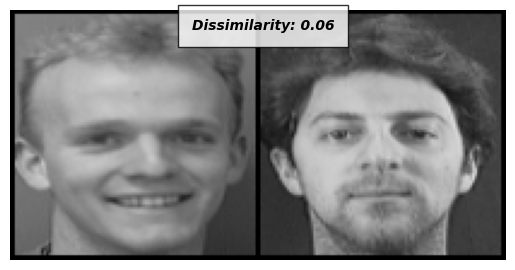

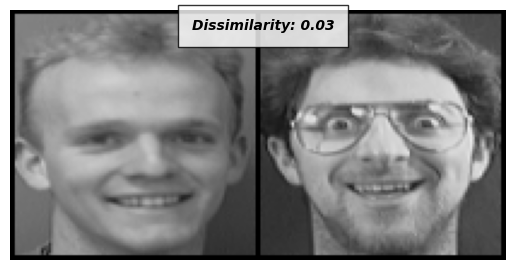

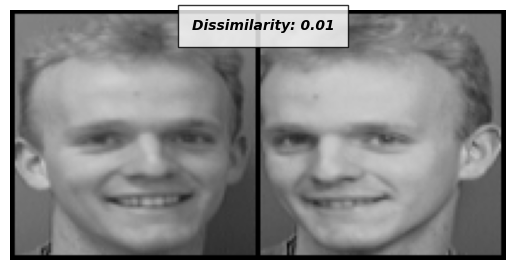

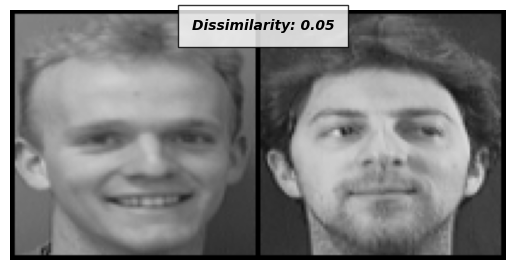

In [40]:
for idx, model in enumerate(model_array):
    print("================================================================")
    print(f"Model with learning rate: {lr_array[idx]}")
    model.eval()
    evaluate_according_to_first_img(model, n_compare_images=5)

Model with n_epochs: 2


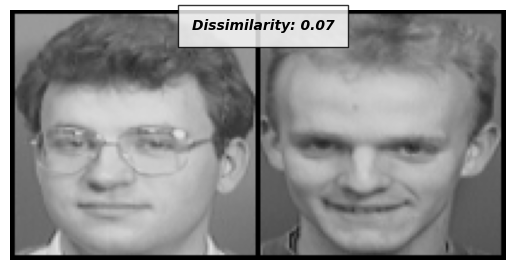

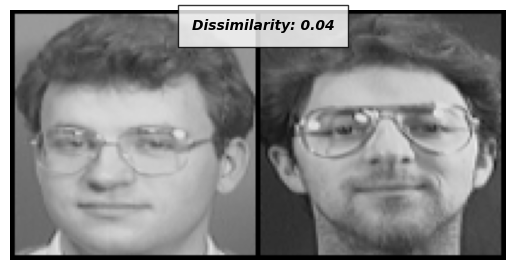

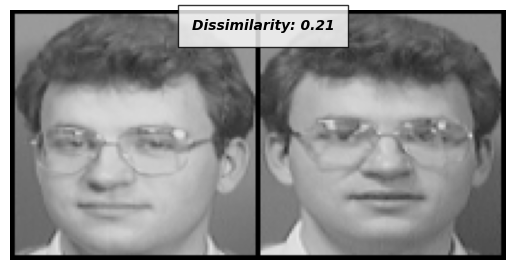

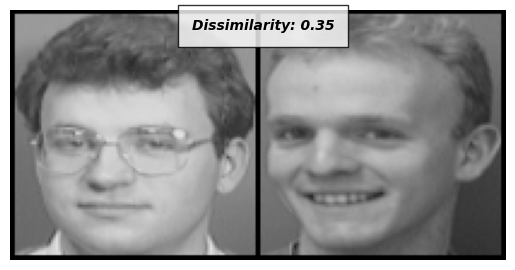

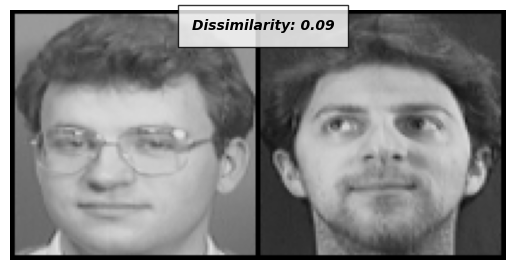

Model with n_epochs: 10


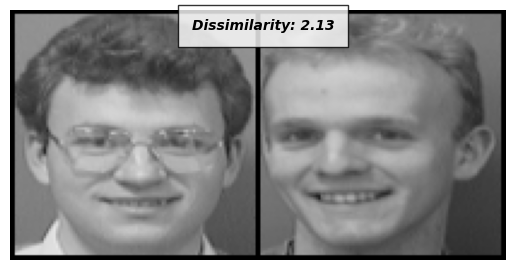

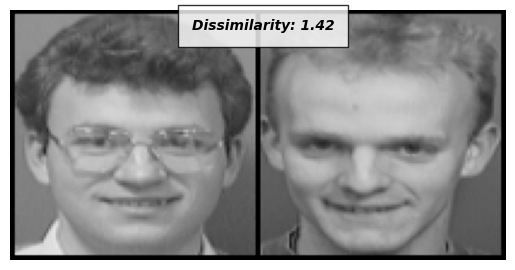

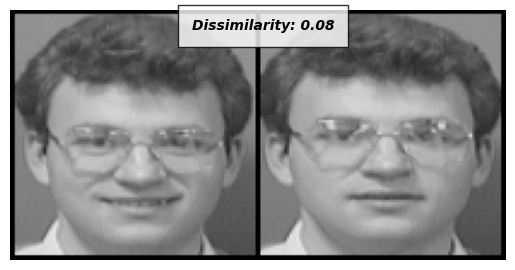

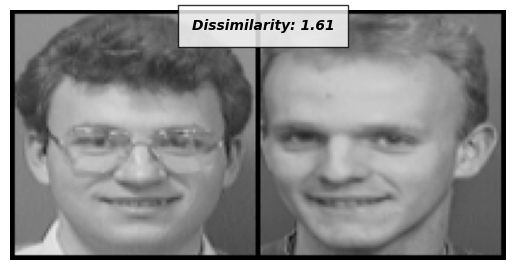

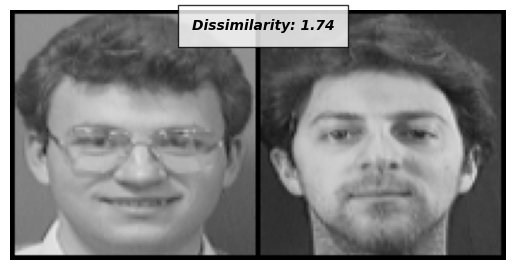

Model with n_epochs: 20


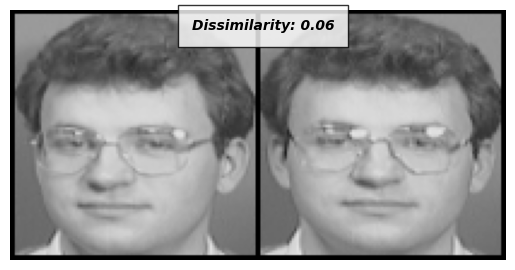

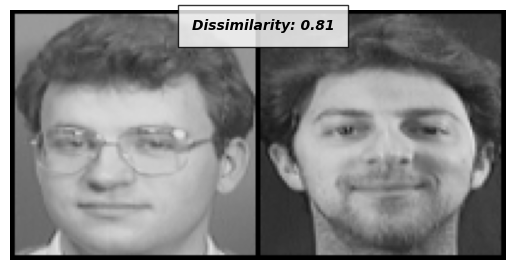

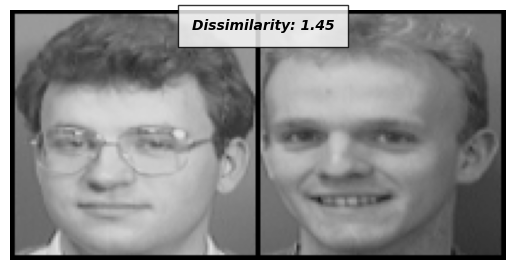

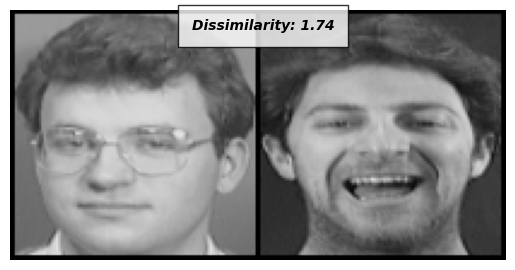

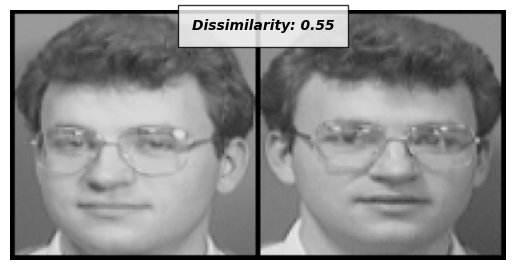

Model with n_epochs: 30


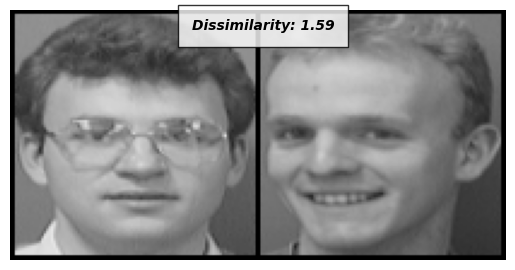

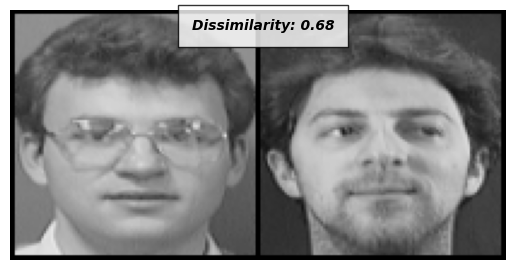

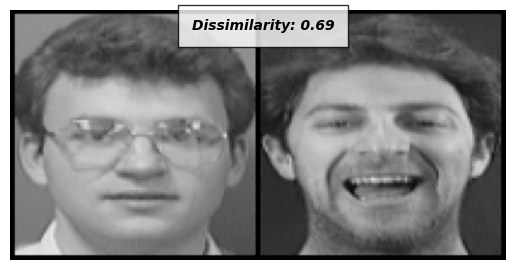

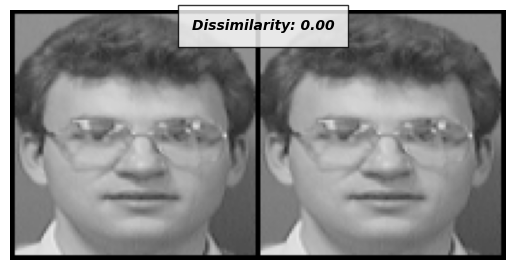

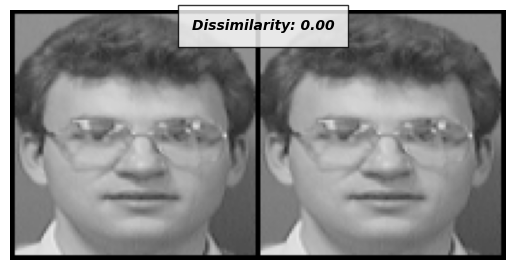

Model with n_epochs: 50


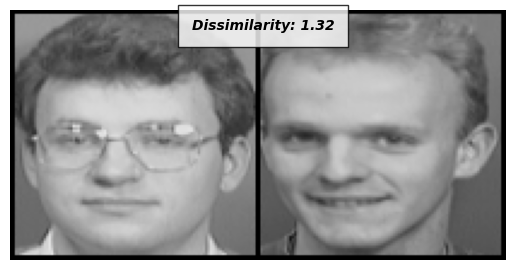

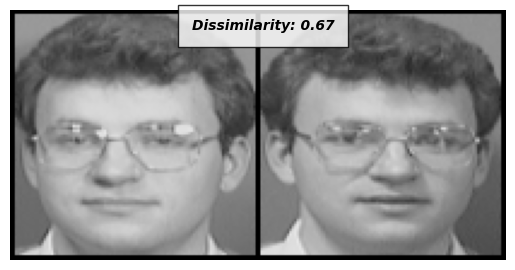

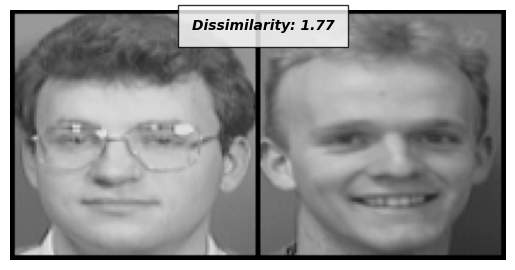

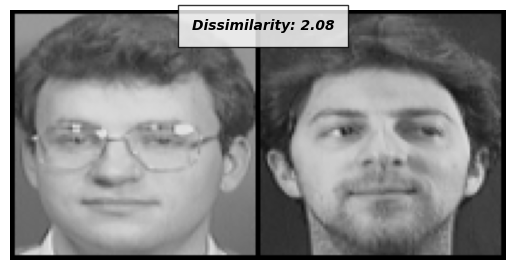

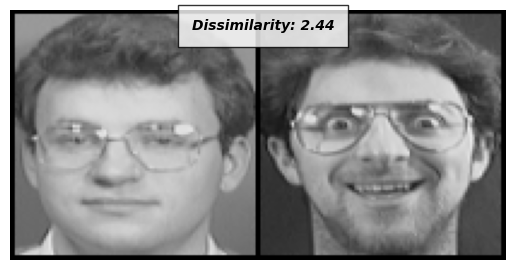

Model with n_epochs: 70


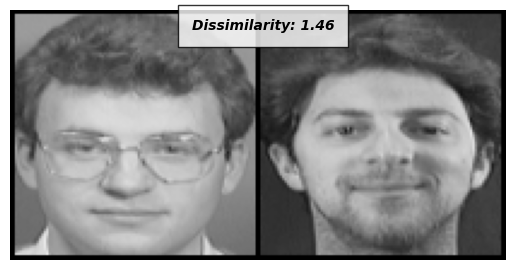

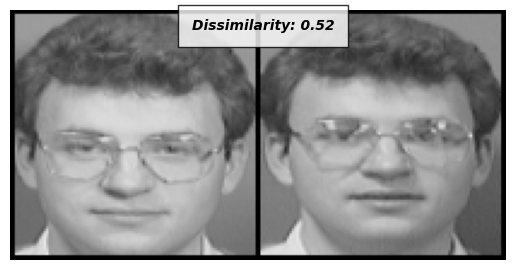

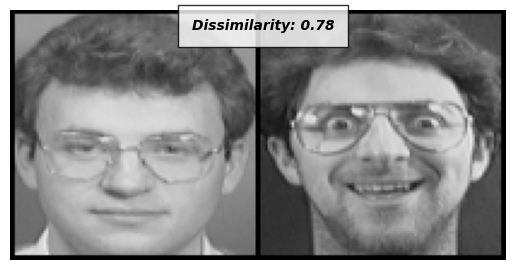

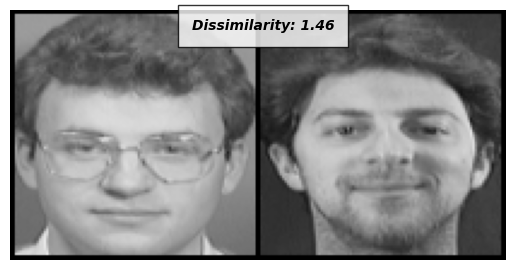

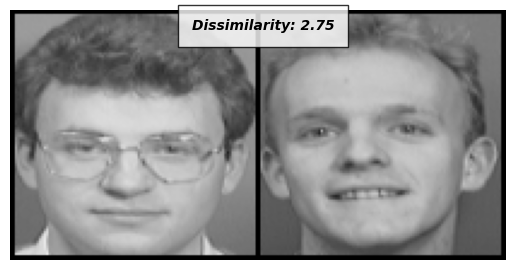

Model with n_epochs: 100


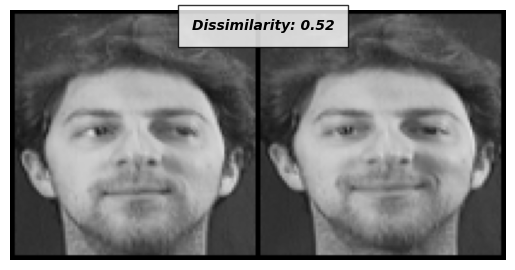

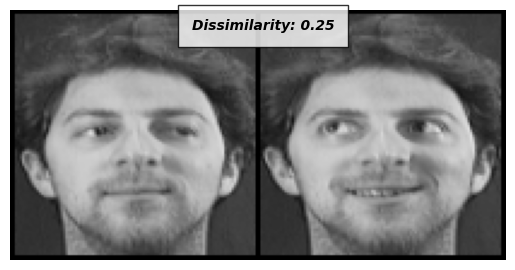

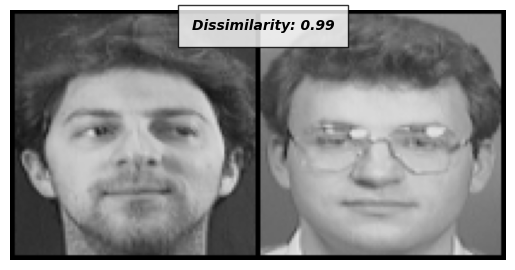

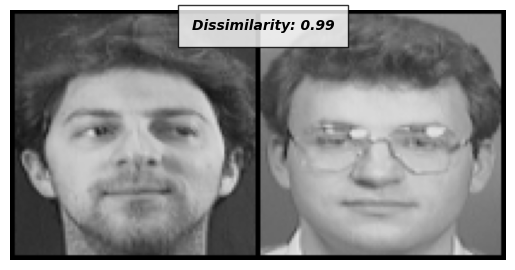

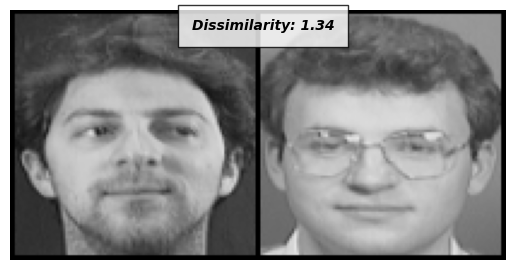

Model with n_epochs: 300


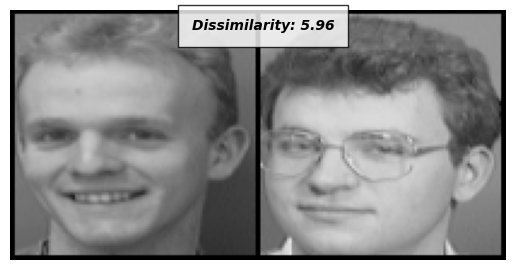

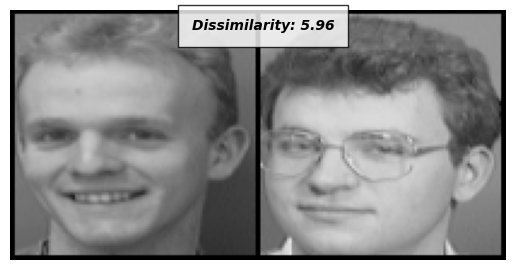

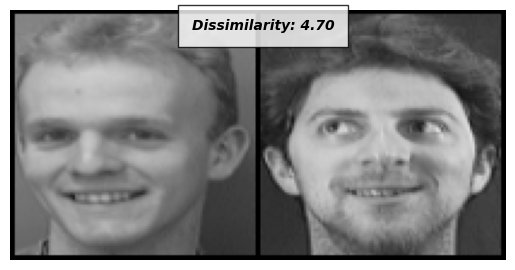

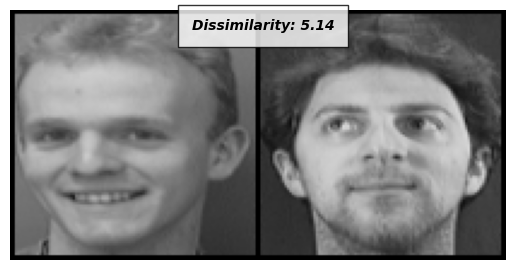

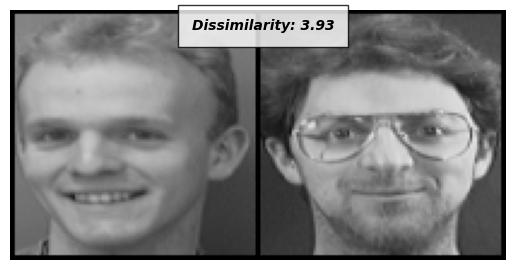

In [44]:
for idx, model in enumerate(model_epochs_array):
    print("================================================================")
    print(f"Model with n_epochs: {epochs_array[idx]}")
    model.eval()
    evaluate_according_to_first_img(model, n_compare_images=5)

# Double Siamese implementation

## Simplify classification head

In [15]:
class SiameseNetworkSimplified(nn.Module):
    def __init__(self):
        super(SiameseNetworkSimplified, self).__init__()

        self.cnn1 = nn.Sequential(
            nn.Conv2d(1, 96, kernel_size=11, stride=4),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(3, stride=2),
            nn.Conv2d(96, 256, kernel_size=5, stride=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2, stride=2),
            nn.Conv2d(256, 384, kernel_size=3, stride=1),
            nn.ReLU(inplace=True),
        )

        self.fc1 = nn.Sequential(
            nn.Linear(384, 128),
            nn.ReLU(inplace=True),
            nn.Linear(128, 256),
            nn.ReLU(inplace=True),
            nn.Linear(256, 2),
        )

    def forward_once(self, x):
        # Funkcja zostanie wywołana osobno dla każdej próbki
        # Jej wyjście zostanie wykorzystane w celu określenia odległości
        output = self.cnn1(x)
        output = output.view(output.size()[0], -1)
        output = self.fc1(output)
        return output

    def forward(self, input1, input2):
        # Funkcja przyjmuje obie próbki i zwraca parę wektorów
        output1 = self.forward_once(input1)
        output2 = self.forward_once(input2)

        return output1, output2

## Change of measuring type to L1 

In [16]:
class ContrastiveLossL1(torch.nn.Module):
    def __init__(self, margin=2.0):
        super(ContrastiveLossL1, self).__init__()
        self.margin = margin

    def forward(self, output1, output2, label):
        l1_distance = F.pairwise_distance(output1, output2, keepdim=True, p=1)

        loss_contrastive = torch.mean(
            (1 - label) * torch.pow(l1_distance, 2)
            + label * torch.pow(torch.clamp(self.margin - l1_distance, min=0.0), 2)
        )

        return loss_contrastive

Epoch:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch number 0
 Current loss 1.8717739582061768
Epoch number 1
 Current loss 0.9356352090835571
Epoch number 2
 Current loss 0.6107490658760071
Epoch number 3
 Current loss 0.473362535238266
Epoch number 4
 Current loss 0.7273881435394287
Epoch number 5
 Current loss 0.8069642782211304
Epoch number 6
 Current loss 0.579986572265625
Epoch number 7
 Current loss 0.9449164271354675

Epoch number 8
 Current loss 0.6990877389907837
Epoch number 9
 Current loss 0.8795754313468933
Epoch number 10
 Current loss 0.6921581029891968
Epoch number 11
 Current loss 0.9062889218330383
Epoch number 12
 Current loss 0.7974520921707153
Epoch number 13
 Current loss 0.9048638343811035
Epoch number 14
 Current loss 0.36481672525405884
Epoch number 15
 Current loss 0.8285489082336426
Epoch number 16
 Current loss 0.652833104133606
Epoch number 17
 Current loss 0.4889129400253296
Epoch number 18
 Current loss 0.5058777928352356
Epoch number 19
 Current loss 0.4582505524158478
Epoch number 20
 Current loss 0

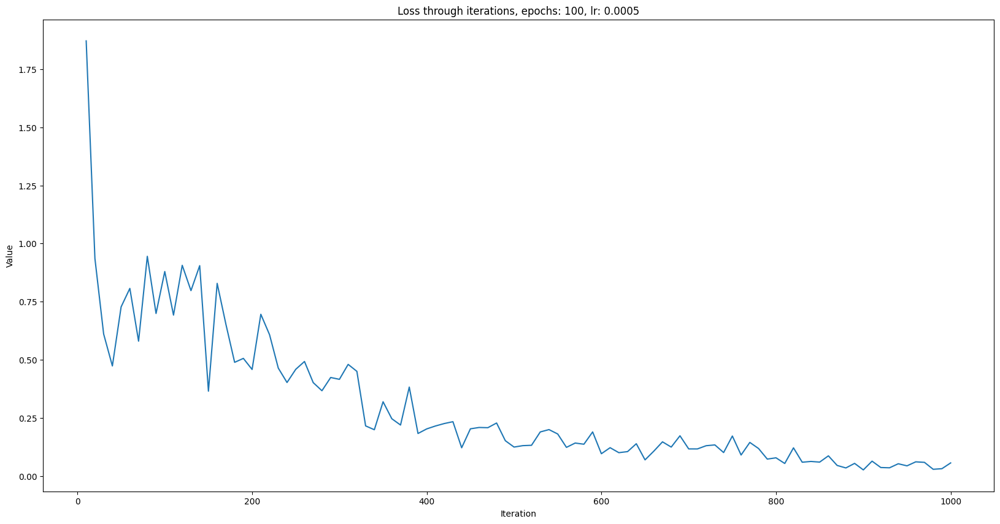

In [24]:
net = SiameseNetwork().to(device)
criterion_func = ContrastiveLossL1()
optimizer = optim.Adam(net.parameters(), lr=0.0005)

fit(
    model=net,
    criterion=criterion_func,
    optimizer=optimizer,
    train_dl=train_dataloader,
    n_epochs=100,
    lr=0.0005,
    savefig=False,
    verbose=True,
)

## Simplified classification head

Epoch:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch number 0
 Current loss 2.3719406127929688
Epoch number 1
 Current loss 1.575295329093933
Epoch number 2
 Current loss 0.7739930152893066
Epoch number 3
 Current loss 0.7956393361091614
Epoch number 4
 Current loss 0.7573133707046509
Epoch number 5
 Current loss 0.7855756282806396
Epoch number 6
 Current loss 0.6988911628723145
Epoch number 7
 Current loss 0.5263423919677734
Epoch number 8
 Current loss 0.8634556531906128
Epoch number 9
 Current loss 0.6428404450416565
Epoch number 10
 Current loss 0.6437145471572876
Epoch number 11
 Current loss 0.5736891031265259
Epoch number 12
 Current loss 0.45477110147476196
Epoch number 13
 Current loss 0.5268906950950623
Epoch number 14
 Current loss 0.4156758189201355
Epoch number 15
 Current loss 0.33317267894744873
Epoch number 16
 Current loss 0.445302277803421
Epoch number 17
 Current loss 0.575391948223114
Epoch number 18
 Current loss 0.45981475710868835
Epoch number 19
 Current loss 0.45198947191238403
Epoch number 20
 Current loss

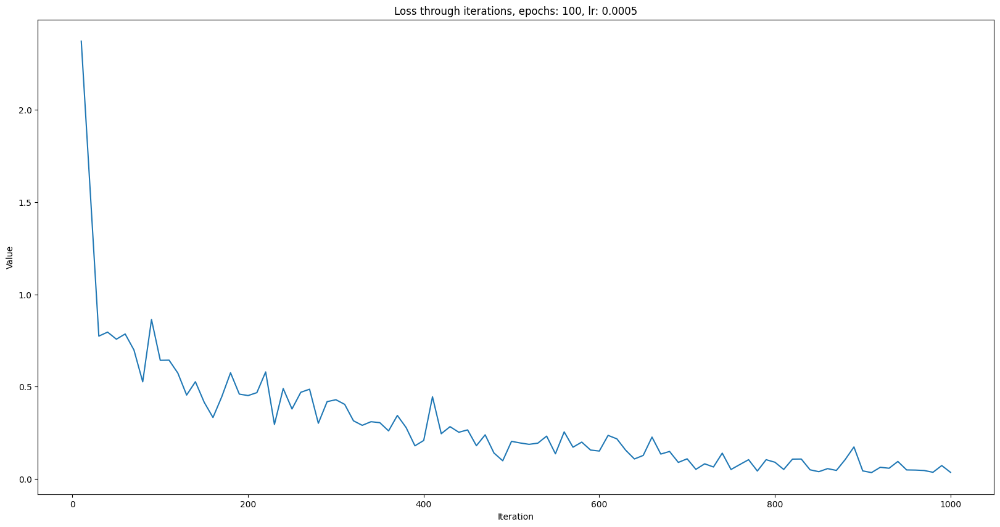

In [19]:
net = SiameseNetworkSimplified().to(device)
criterion_func = ContrastiveLoss()
optimizer = optim.Adam(net.parameters(), lr=0.0005)

fit(
    model=net,
    criterion=criterion_func,
    optimizer=optimizer,
    train_dl=train_dataloader,
    n_epochs=100,
    lr=0.0005,
    savefig=False,
    verbose=True,
)

## Dissimilarity measurement for modified siamese net.

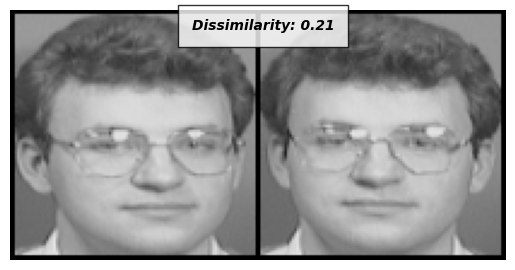

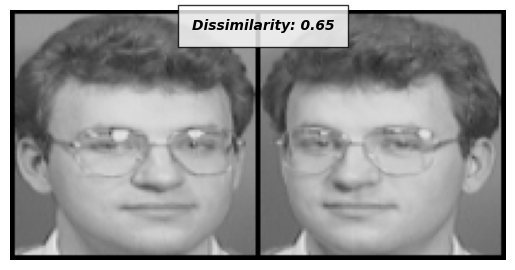

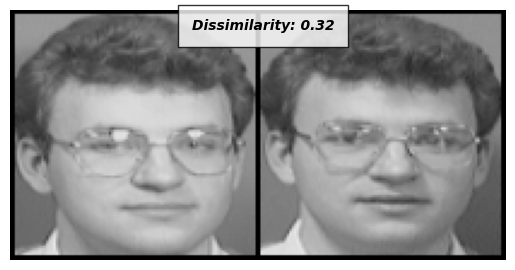

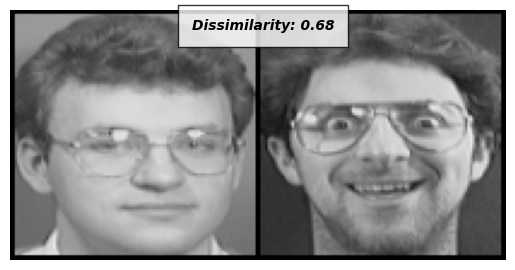

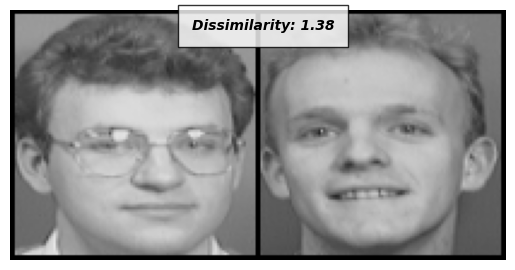

In [25]:
net.eval()
evaluate_according_to_first_img(net, n_compare_images=5)

# Triple Siamese net implementation

## Dataset

In [14]:
class SiameseTripleNetworkDataset(Dataset):
    def __init__(self, imageFolderDataset, transform=None):
        self.imageFolderDataset = imageFolderDataset
        self.transform = transform

    def __getitem__(self, index):
        img_anchor_tuple = random.choice(self.imageFolderDataset.imgs)

        # We need anchor -> img0_tuple[1] is anchor
        # we need positive example -> img1_tuple[1] is positive
        # we need negative example -> img2_tuple[1] is negative

        # should_get_same_class = random.randint(0,1)

        while True:
            # Wyszukiwanie zdjęcia tej samej osoby
            img_positive_tuple = random.choice(self.imageFolderDataset.imgs)
            if img_anchor_tuple[1] == img_positive_tuple[1]:
                break

        while True:
            # Wyszukiwanie zdjęcia innej osoby
            img_negative_tuple = random.choice(self.imageFolderDataset.imgs)
            if img_anchor_tuple[1] != img_negative_tuple[1]:
                break

        img_anchor = Image.open(img_anchor_tuple[0])
        img_positive = Image.open(img_positive_tuple[0])
        img_negative = Image.open(img_negative_tuple[0])

        img_anchor = img_anchor.convert("L")
        img_positive = img_positive.convert("L")
        img_negative = img_negative.convert("L")

        if self.transform is not None:
            img_anchor = self.transform(img_anchor)
            img_positive = self.transform(img_positive)
            img_negative = self.transform(img_negative)

        return (
            img_anchor,
            img_positive,
            img_negative,
        )  # torch.from_numpy(np.array([int(img1_tuple[1] != img0_tuple[1])], dtype=np.float32))

    def __len__(self):
        return len(self.imageFolderDataset.imgs)

In [15]:
folder_dataset = datasets.ImageFolder(
    root=f'{os.path.join(data_directory, "faces", "training")}'
)

# Zmiana rozmiaru próbek i konwersja na tensor
transformation = transforms.Compose(
    [transforms.Resize((100, 100)), transforms.ToTensor()]
)

# Inicjalizacja klasy obsługującej zbiór danych
siamese_triple_dataset = SiameseTripleNetworkDataset(
    imageFolderDataset=folder_dataset, transform=transformation
)

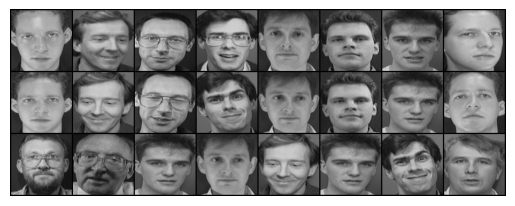

In [16]:
vis_dataloader = DataLoader(
    siamese_triple_dataset,
    shuffle=True,
    # num_workers=2,
    batch_size=8,
)

example_batch = next(iter(vis_dataloader))
concatenated = torch.cat((example_batch[0], example_batch[1], example_batch[2]))

imshow(torchvision.utils.make_grid(concatenated))
# print(example_batch[2].numpy().reshape(-1))

## Triple Siamese

In [17]:
class SiameseTripleNetwork(nn.Module):
    def __init__(self):
        super(SiameseTripleNetwork, self).__init__()

        self.cnn1 = nn.Sequential(
            nn.Conv2d(1, 96, kernel_size=11, stride=4),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(3, stride=2),
            nn.Conv2d(96, 256, kernel_size=5, stride=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2, stride=2),
            nn.Conv2d(256, 384, kernel_size=3, stride=1),
            nn.ReLU(inplace=True),
        )

        self.fc1 = nn.Sequential(
            nn.Linear(384, 1024),
            nn.ReLU(inplace=True),
            nn.Linear(1024, 256),
            nn.ReLU(inplace=True),
            nn.Linear(256, 2),
        )

    def forward_once(self, x):
        # Funkcja zostanie wywołana osobno dla każdej próbki
        # Jej wyjście zostanie wykorzystane w celu określenia odległości
        output = self.cnn1(x)
        output = output.view(output.size()[0], -1)
        output = self.fc1(output)
        return output

    def forward(self, input_anchor, input_positive, input_negative):
        # Funkcja przyjmuje 3 próbki i zwraca 3 wektory
        output_anchor = self.forward_once(input_anchor)
        output_positive = self.forward_once(input_positive)
        output_negative = self.forward_once(input_negative)

        return output_anchor, output_positive, output_negative

    def get_fc1_vectors(self, x):
        # This method returns the vectors from the fc1 layer with size 256
        output = self.cnn1(x)
        output = output.view(output.size()[0], -1)
        fc1_output = self.fc1[:3](output)  # Taking only the first 3 layers of fc1
        return fc1_output

## Contrastive loss 

In [18]:
class ContrastiveTripleLoss(torch.nn.Module):
    def __init__(self, margin=2.0):
        super(ContrastiveTripleLoss, self).__init__()
        self.margin = margin
        self.triplet_loss = nn.TripletMarginLoss(margin=self.margin, p=2, eps=1e-7)

    def forward(self, output1, output2, output3):
        loss = self.triplet_loss(output1, output2, output3)
        loss = torch.clamp(loss, min=0.0, max=50.0)
        return loss
        # distance_positive = F.pairwise_distance(output1, output2, keepdim=True)
        # distance_negative = F.pairwise_distance(output1, output3, keepdim=True)

        # loss = distance_positive - distance_negative + self.margin
        # loss = torch.clamp(loss, min=0.0)  # may be torch.relu(
        # return loss.mean()

        """
        ap_distance = F.pairwise_distance(output1, output2, keepdim = True)  # compute anchor -> positive distance
        an_distance = F.pairwise_distance(output1, output3, keepdim = True)  # compute anchor -> negative distance

        # Computing the Triplet Loss by subtracting both distances and
        # making sure we don't get a negative value.
        loss = ap_distance - an_distance
        loss = torch.clamp(self.margin - loss, min=0.0)

        return loss
        """

## Training loop

In [19]:
def fit_tri_siamese(
    model,
    criterion,
    optimizer,
    train_dl,
    n_epochs=100,
    lr=0.0005,
    savefig=False,
    verbose=True,
):
    counter = []
    loss_history = []
    iteration_number = 0
    model.train()
    # Iteracja po epokach
    for epoch in tqdm(range(n_epochs), desc="Epoch", colour="magenta"):
        # iteracja po pakietach
        for i, (anchor, positive, negative) in enumerate(train_dl, 0):
            # Przeniesienie obrazów i etykiet do pamięci karty graficznej
            anchor, positive, negative = (
                anchor.to(device),
                positive.to(device),
                negative.to(device),
            )

            # Ustawienie wartości gradientów na zero
            optimizer.zero_grad()

            # Przepuszczenie dwóch obrazów przez sieć i uzyskanie dwóch wektorów wyjściowych
            output_anchor, output_positive, output_negative = model(
                anchor, positive, negative
            )

            # Obliczenie wartości funkcji straty na podstawie wektorów wyjściowych
            loss_contrastive = criterion(
                output_anchor, output_positive, output_negative
            )
            # loss_contrastive = torch.mean(loss_contrastive)
            # Obliczenie zmian wag w oparciu o wartość funkcji straty
            loss_contrastive.backward()

            # Aktualizacja wag sieci
            optimizer.step()

            # Wyświetlenie wartości funkcji straty co 10 pakietów
            if i % 10 == 0:
                if verbose:
                    print(
                        f"Epoch number {epoch}\n Current loss {loss_contrastive.item()}\n"
                    )
                iteration_number += 10

                counter.append(iteration_number)
                loss_history.append(loss_contrastive.item())

    show_plot(
        counter,
        loss_history,
        lr=lr,
        savefig=savefig,
        n_epochs=n_epochs,
        save_dir=docs_triple_siamese,
    )

## Training

In [20]:
train_dataloader_triple = DataLoader(
    siamese_triple_dataset,
    shuffle=True,
    # num_workers=8,
    batch_size=64,
)

Epoch:   0%|          | 0/200 [00:00<?, ?it/s]

Epoch number 0
 Current loss 1.9989941120147705
Epoch number 1
 Current loss 1.3961882591247559
Epoch number 2
 Current loss 1.4400073289871216
Epoch number 3
 Current loss 0.6849852800369263
Epoch number 4
 Current loss 0.8950109481811523
Epoch number 5
 Current loss 0.8118354082107544
Epoch number 6
 Current loss 0.942854642868042
Epoch number 7
 Current loss 0.9844471216201782
Epoch number 8
 Current loss 0.6784237623214722
Epoch number 9
 Current loss 0.6637427806854248
Epoch number 10
 Current loss 0.517415463924408
Epoch number 11
 Current loss 0.7802597284317017
Epoch number 12
 Current loss 0.6392353773117065
Epoch number 13
 Current loss 0.5886111855506897
Epoch number 14
 Current loss 0.7675533294677734
Epoch number 15
 Current loss 0.883694052696228

Epoch number 16
 Current loss 0.5848839282989502

Epoch number 17
 Current loss 0.5459135174751282
Epoch number 18
 Current loss 0.5596984028816223
Epoch number 19
 Current loss 0.6132216453552246
Epoch number 20
 Current loss 0

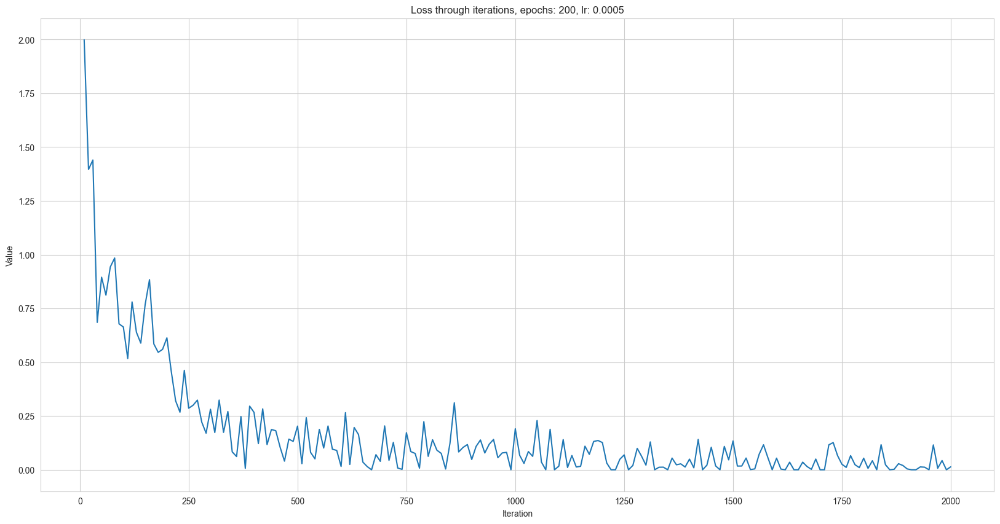

In [21]:
net_tri = SiameseTripleNetwork().to(device)
criterion_func = ContrastiveTripleLoss()
optimizer = optim.Adam(net_tri.parameters(), lr=0.0005)

fit_tri_siamese(
    model=net_tri,
    criterion=criterion_func,
    optimizer=optimizer,
    train_dl=train_dataloader_triple,
    n_epochs=200,
    lr=0.0005,
    savefig=False,
    verbose=True,
)

## Evaluation

In [22]:
def evaluate_according_to_first_img(model, n_compare_images=5):
    dataiter = iter(test_dataloader)
    x0, _, _ = next(dataiter)

    for i in range(n_compare_images):
        _, x1, x2 = next(dataiter)
        concatenated = torch.cat((x0, x1), 0)

        output1, output2, output3 = model(x0.to(device), x1.to(device), x2.to(device))
        euclidean_distance = F.pairwise_distance(output1, output2)
        imshow(
            torchvision.utils.make_grid(concatenated),
            f"Dissimilarity: {euclidean_distance.item():.2f}",
        )


def evaluate_triple_siamese(model, n_compare_images=5):
    dataiter = iter(test_dataloader)
    anchor, _, _ = next(dataiter)

    for i in range(n_compare_images):
        _, positive_example, negative_example = next(dataiter)
        concatenated = torch.cat((anchor, positive_example, negative_example))

        output1, output2, output3 = model(
            anchor.to(device), positive_example.to(device), negative_example.to(device)
        )

        ap_distance = F.pairwise_distance(
            output1, output2, keepdim=True
        )  # compute anchor -> positive distance
        an_distance = F.pairwise_distance(
            output1, output3, keepdim=True
        )  # compute anchor -> negative distance

        imshow(
            torchvision.utils.make_grid(concatenated),
            f"Dissimilarity Anch. -> Pos: {ap_distance.item():.2f}, Anch. -> Neg: {an_distance.item():.2f}",
        )

In [23]:
folder_dataset_test = datasets.ImageFolder(
    root=f'{os.path.join(data_directory, "faces", "testing")}'
)

siamese_dataset_test_tri = SiameseTripleNetworkDataset(
    imageFolderDataset=folder_dataset_test, transform=transformation
)
test_dataloader = DataLoader(
    siamese_dataset_test_tri,
    # num_workers=2,
    batch_size=1,
    shuffle=True,
)

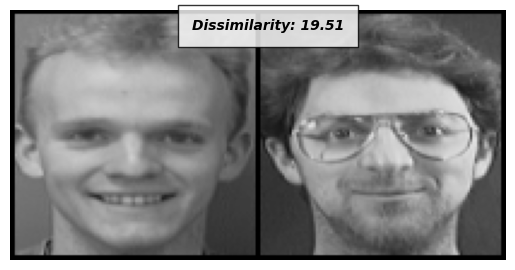

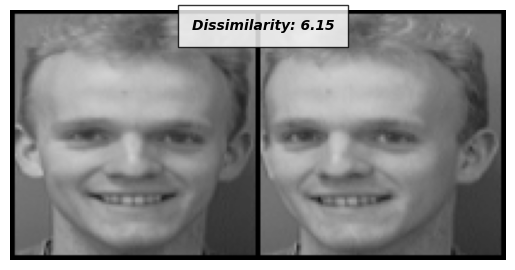

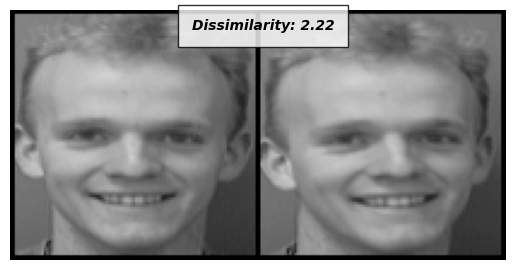

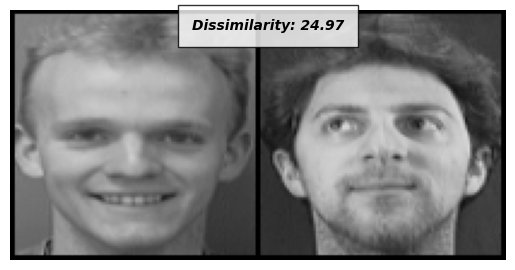

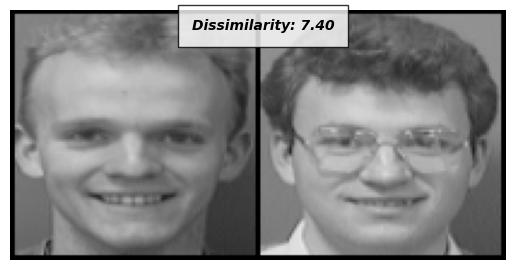

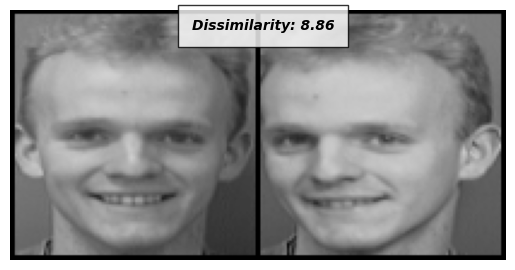

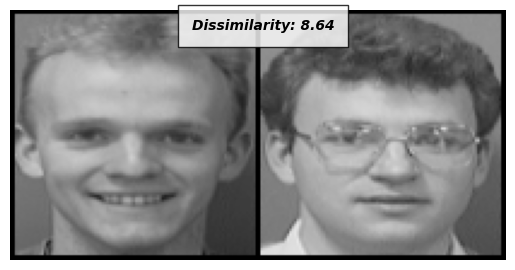

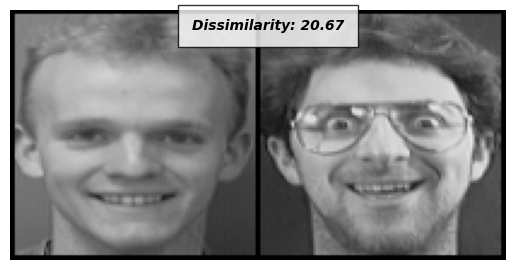

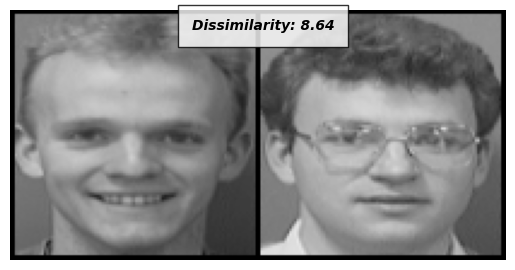

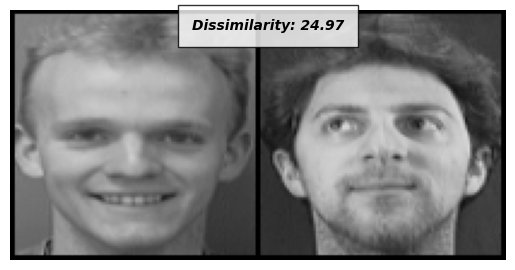

In [64]:
evaluate_according_to_first_img(net_tri, 10)

# Hiperparameters analysis for triple Siamese

## Lr analysis

Learning rate analysis:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch:   0%|          | 0/100 [00:00<?, ?it/s]

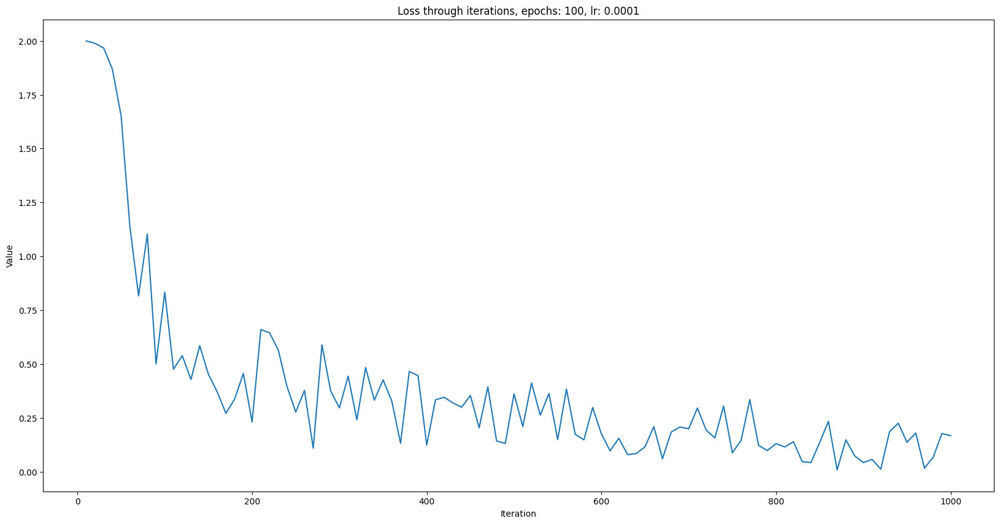

Epoch:   0%|          | 0/100 [00:00<?, ?it/s]

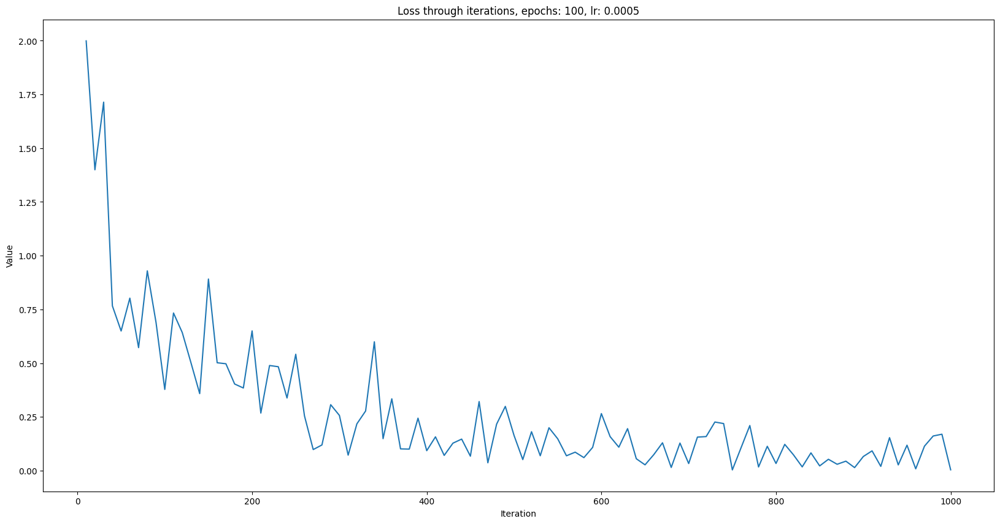

Epoch:   0%|          | 0/100 [00:00<?, ?it/s]

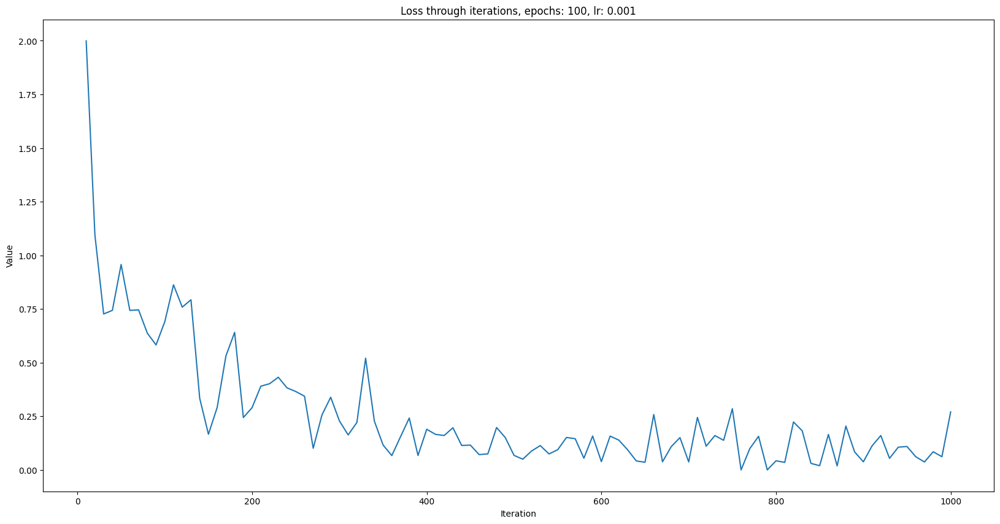

Epoch:   0%|          | 0/100 [00:00<?, ?it/s]

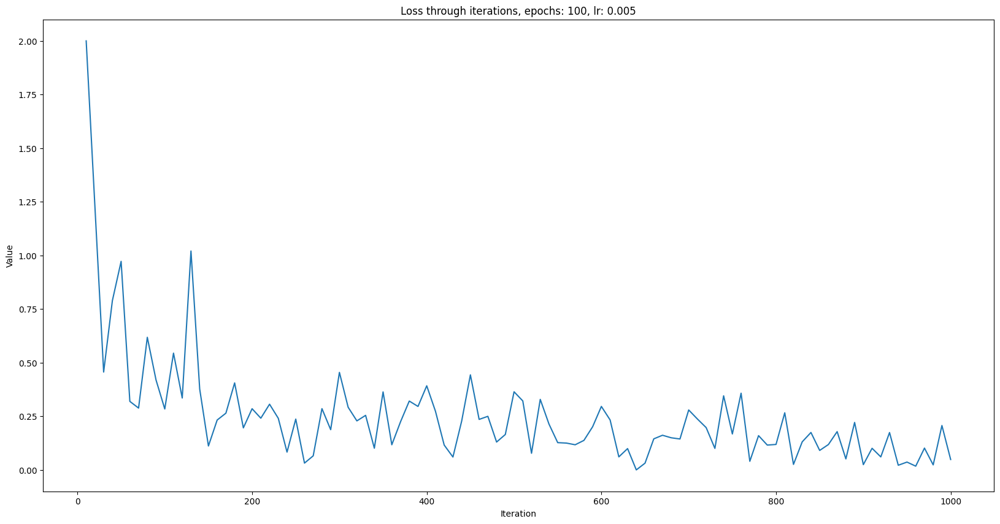

Epoch:   0%|          | 0/100 [00:00<?, ?it/s]

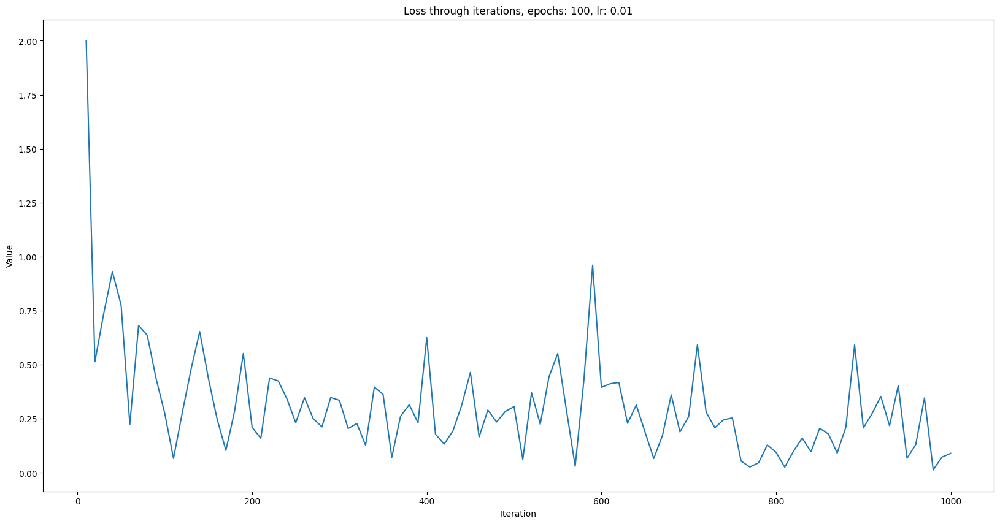

Epoch:   0%|          | 0/100 [00:00<?, ?it/s]

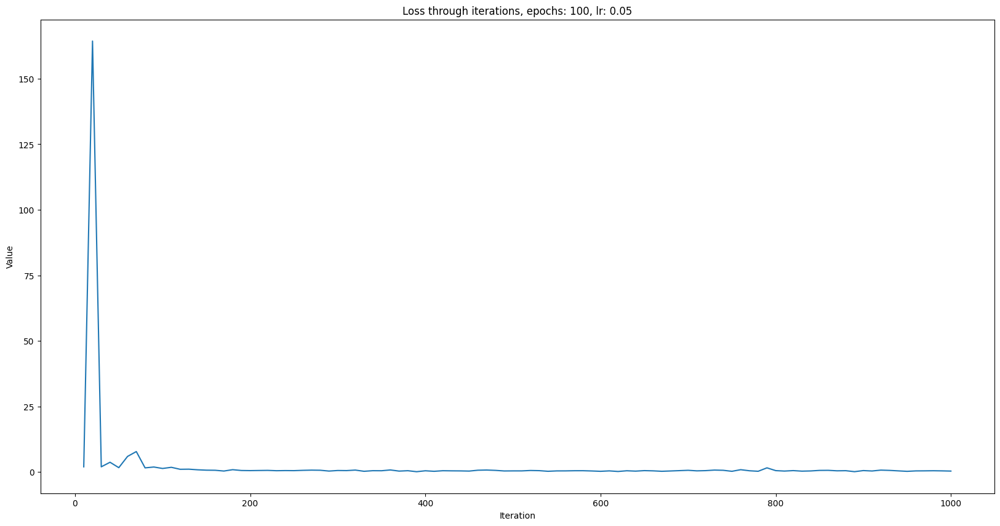

Epoch:   0%|          | 0/100 [00:00<?, ?it/s]

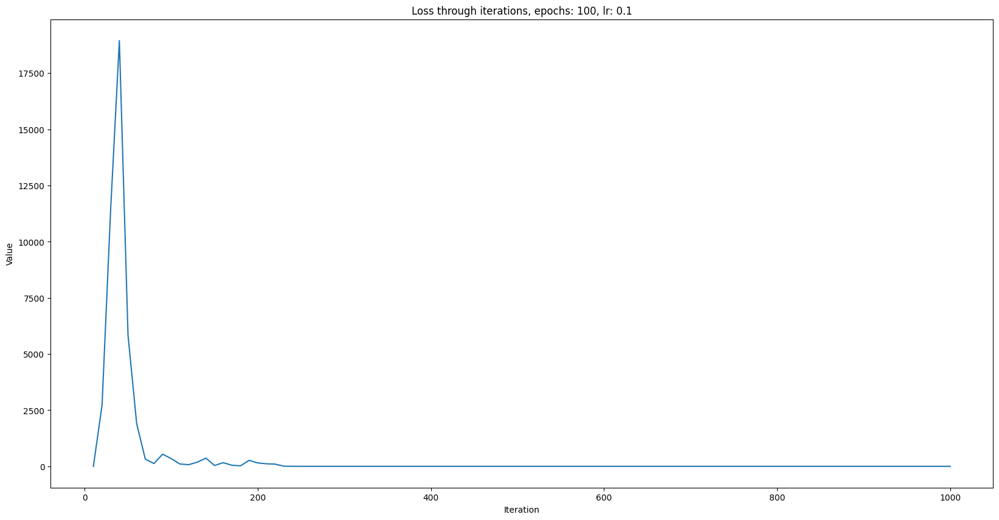

Epoch:   0%|          | 0/100 [00:00<?, ?it/s]

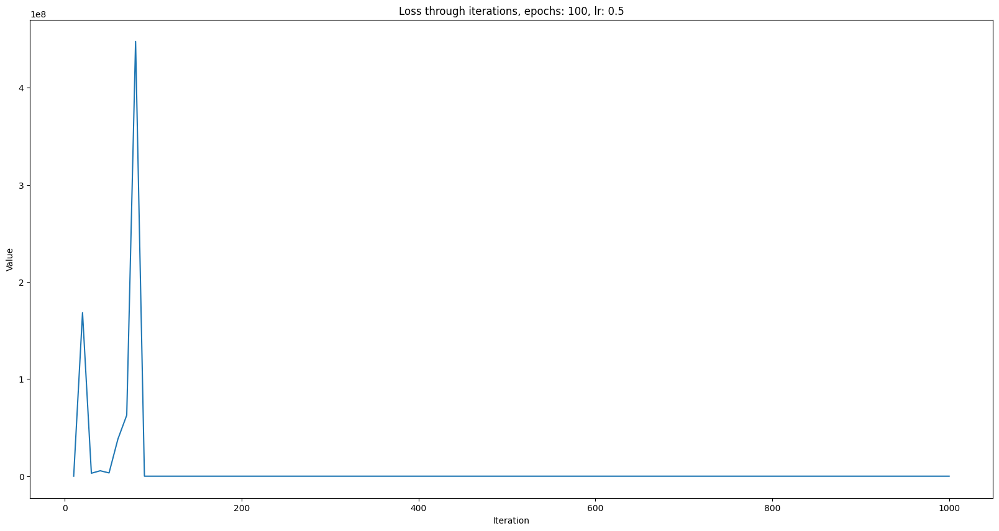

Epoch:   0%|          | 0/100 [00:00<?, ?it/s]

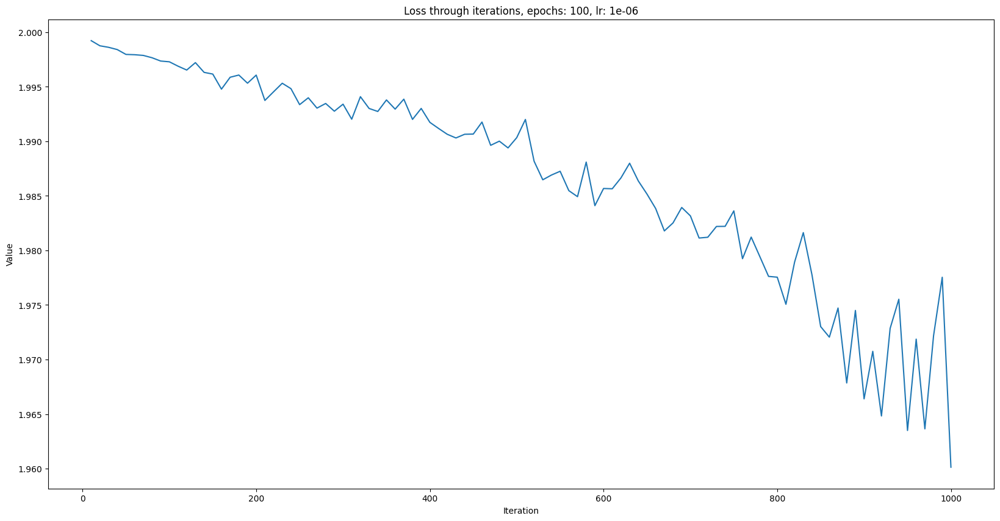

In [56]:
lr_array = [0.0001, 0.0005, 0.001, 0.005, 0.01, 0.05, 0.1, 0.5, 0.000001]
model_array = [SiameseTripleNetwork().to(device) for i in range(len(lr_array))]

for idx, lr in tqdm(
    enumerate(lr_array),
    desc="Learning rate analysis",
    total=len(lr_array),
    colour="yellow",
):
    model_siamese = model_array[idx]
    criterion_f = ContrastiveTripleLoss()
    optimizer = optim.Adam(model_siamese.parameters(), lr=lr)
    fit_tri_siamese(
        model=model_siamese,
        criterion=criterion_f,
        optimizer=optimizer,
        train_dl=train_dataloader_triple,
        n_epochs=100,
        lr=lr,
        savefig=True,
        verbose=False,
    )

Model with learning rate: 0.0001


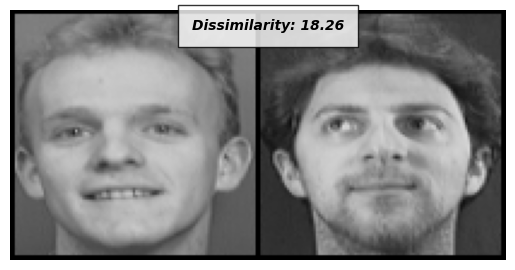

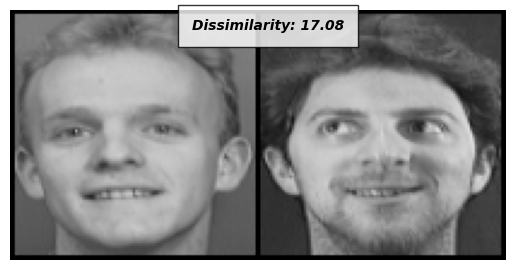

Model with learning rate: 0.0005


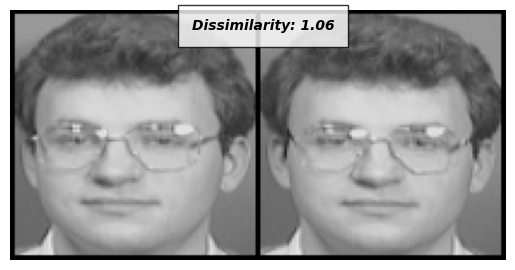

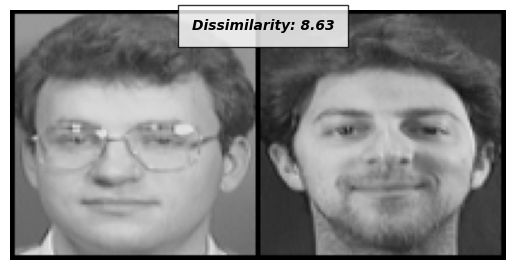

Model with learning rate: 0.001


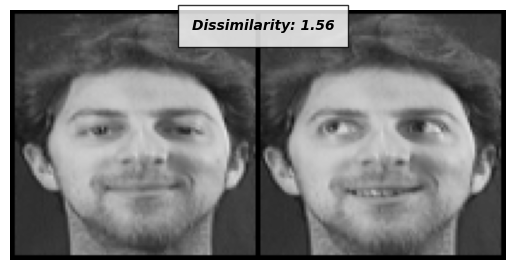

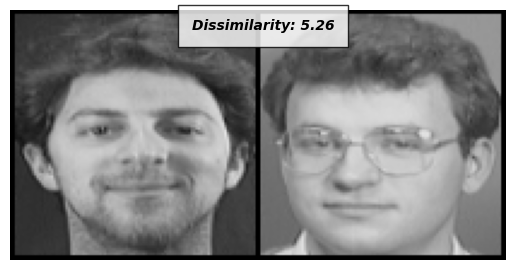

Model with learning rate: 0.005


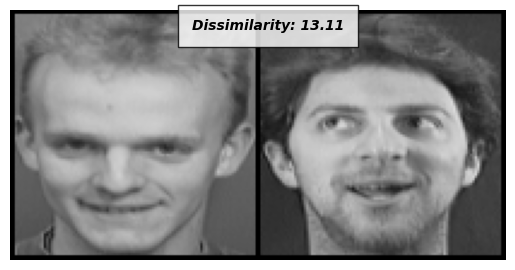

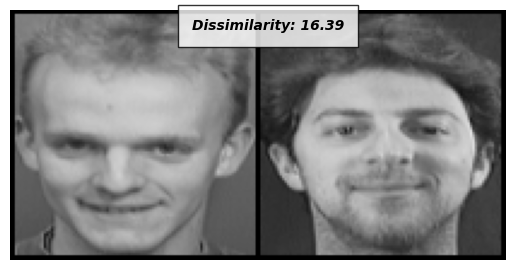

Model with learning rate: 0.01


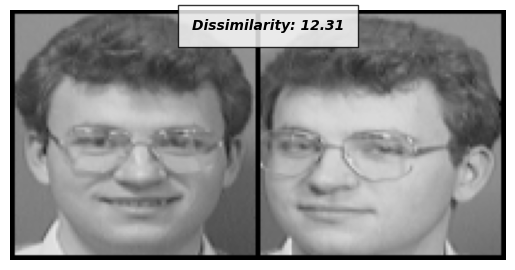

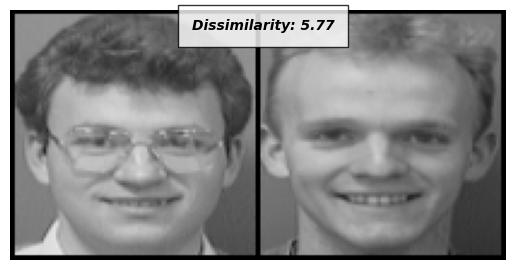

Model with learning rate: 0.05


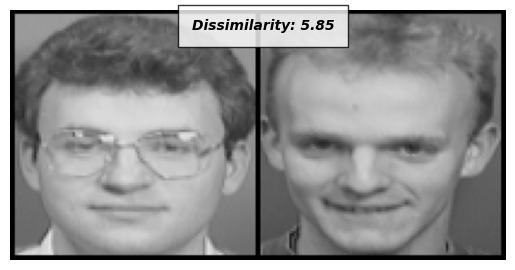

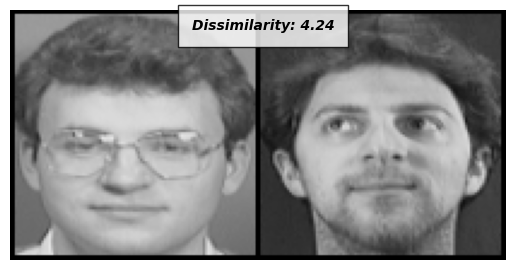

Model with learning rate: 0.1


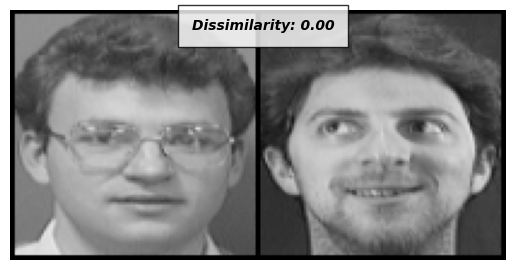

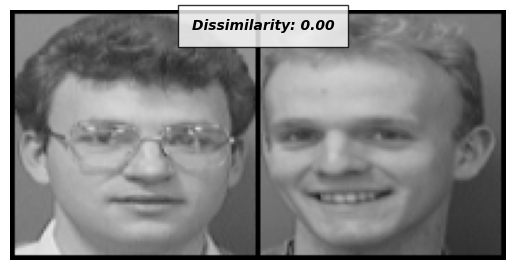

Model with learning rate: 0.5


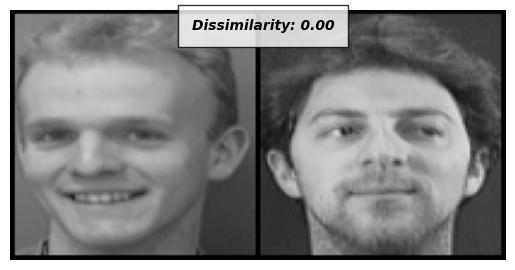

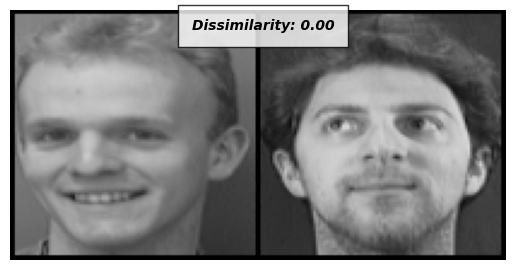

Model with learning rate: 1e-06


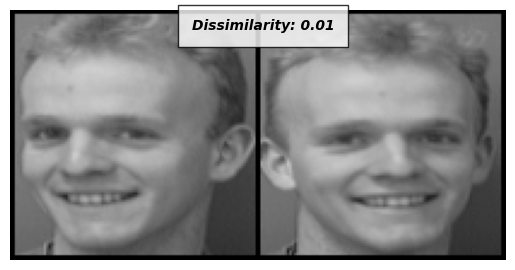

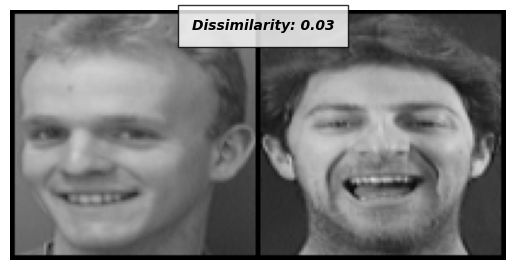

In [57]:
for idx, model in enumerate(model_array):
    print("================================================================")
    print(f"Model with learning rate: {lr_array[idx]}")
    model.eval()
    evaluate_according_to_first_img(model, n_compare_images=2)

## Epochs analysis

N epochs analysis:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch:   0%|          | 0/2 [00:00<?, ?it/s]

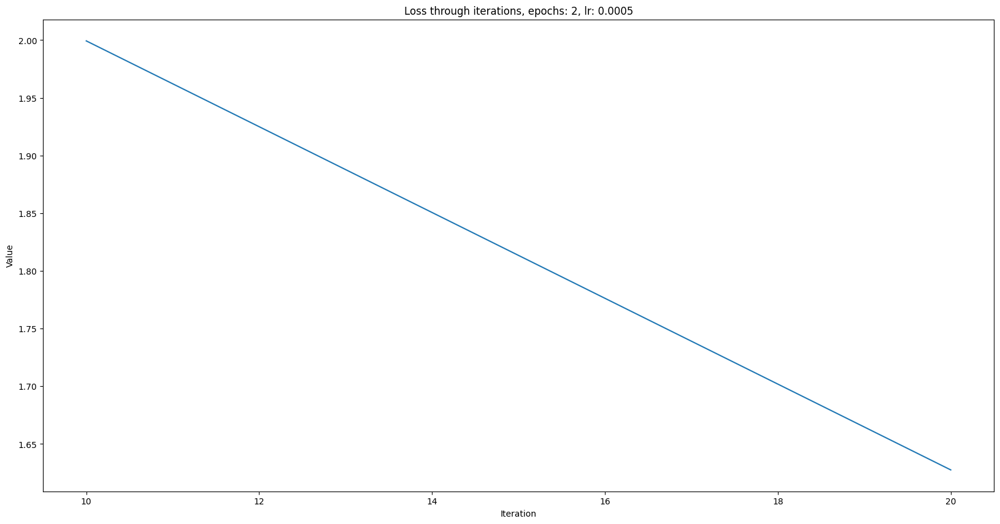

Epoch:   0%|          | 0/10 [00:00<?, ?it/s]

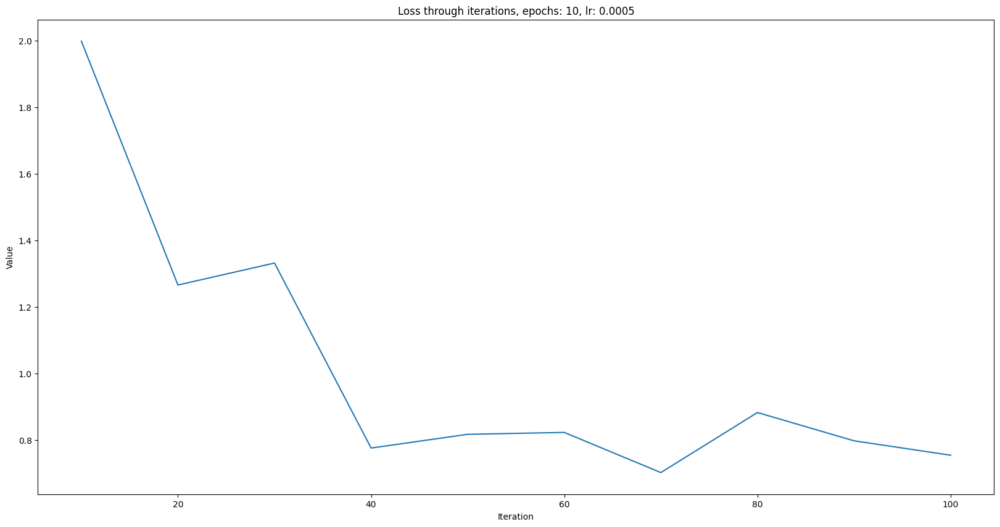

Epoch:   0%|          | 0/20 [00:00<?, ?it/s]

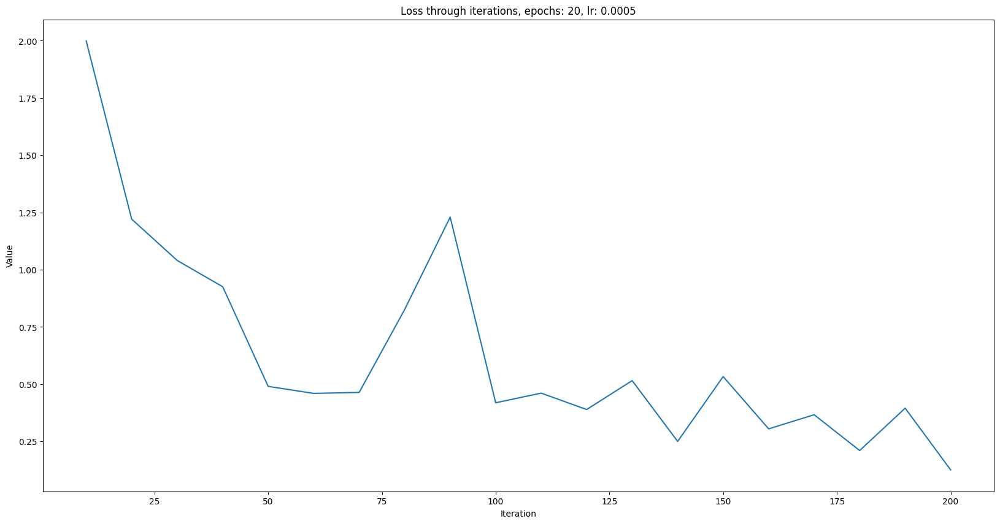

Epoch:   0%|          | 0/30 [00:00<?, ?it/s]

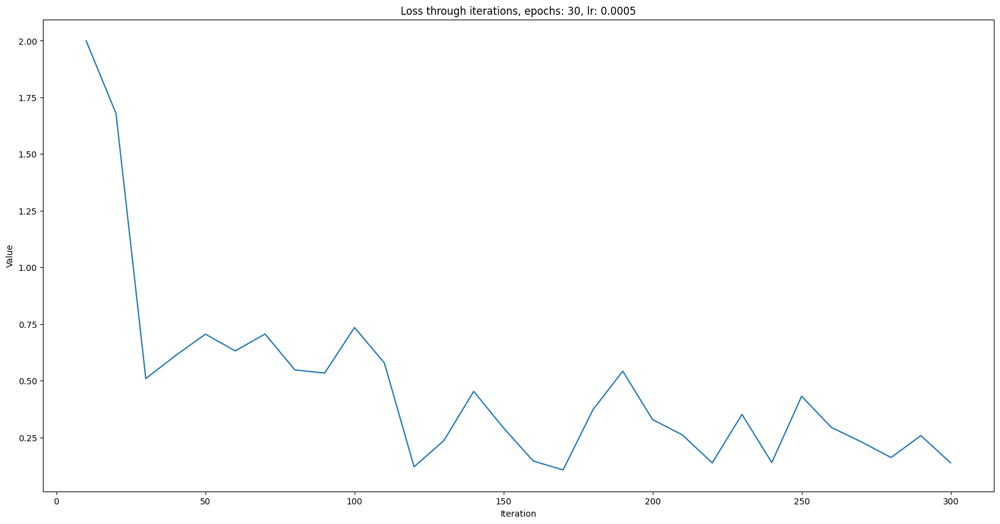

Epoch:   0%|          | 0/50 [00:00<?, ?it/s]

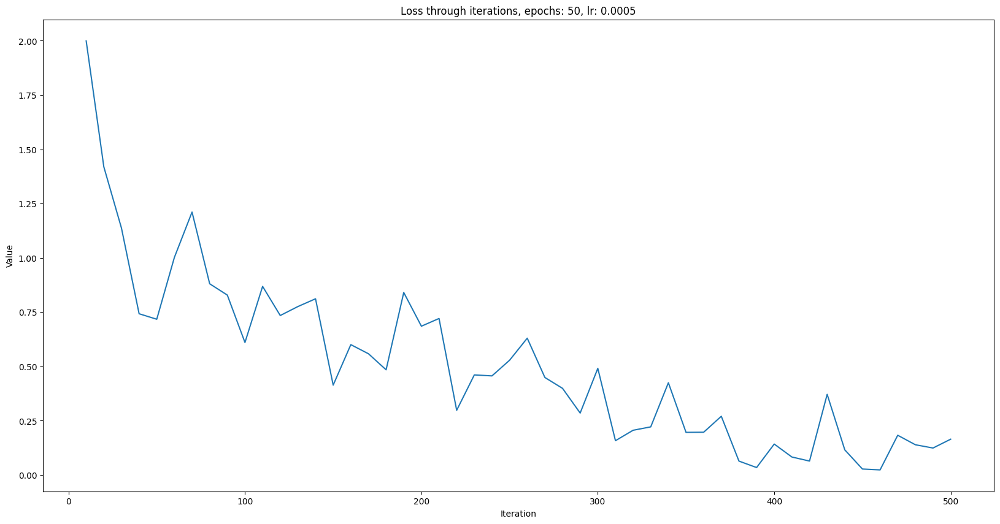

Epoch:   0%|          | 0/70 [00:00<?, ?it/s]

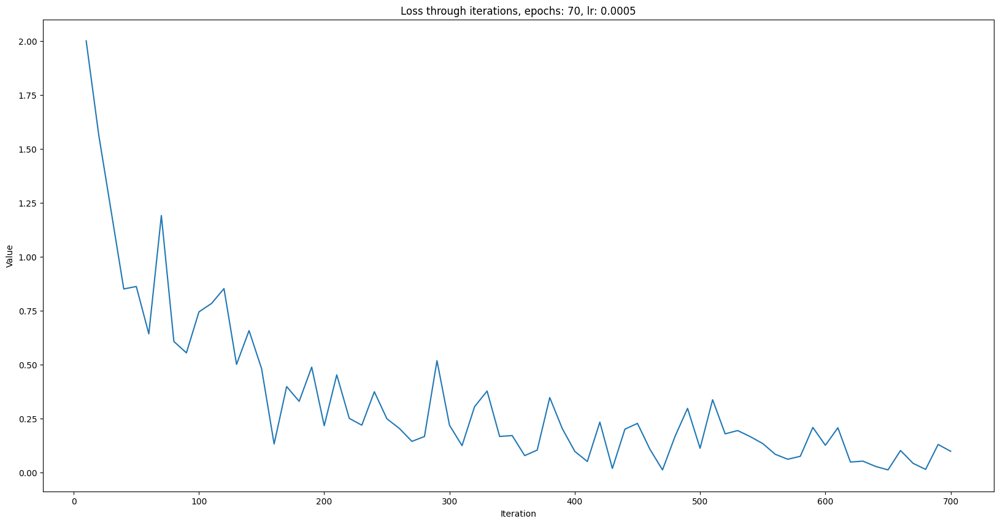

Epoch:   0%|          | 0/100 [00:00<?, ?it/s]

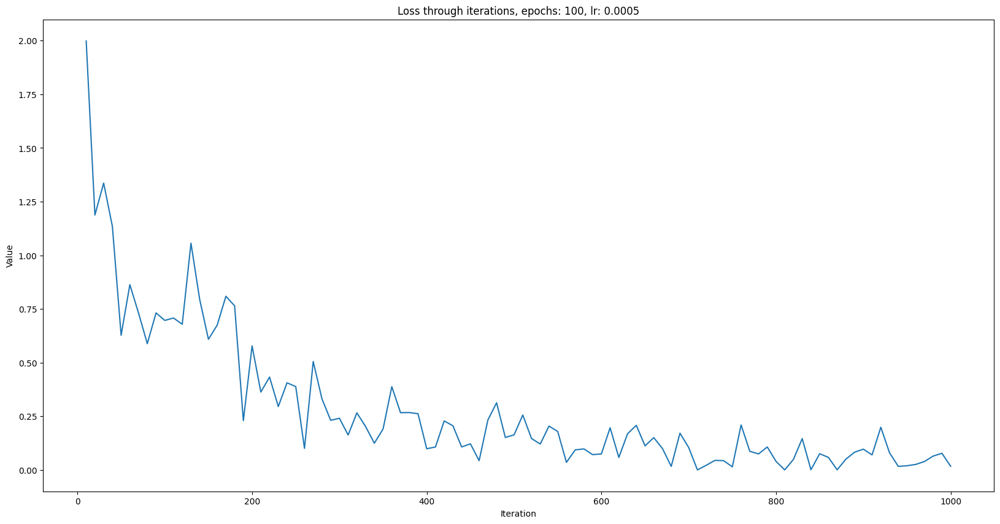

Epoch:   0%|          | 0/200 [00:00<?, ?it/s]

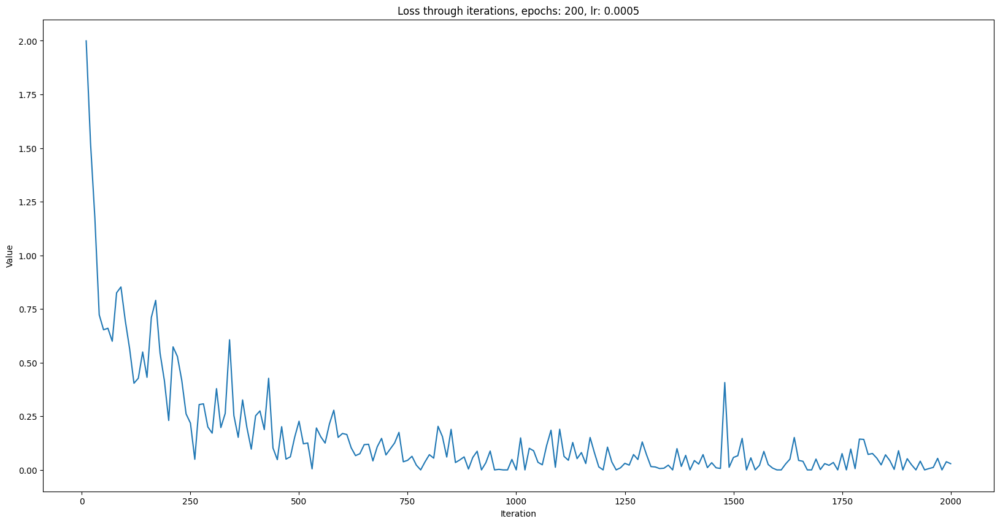

Epoch:   0%|          | 0/300 [00:00<?, ?it/s]

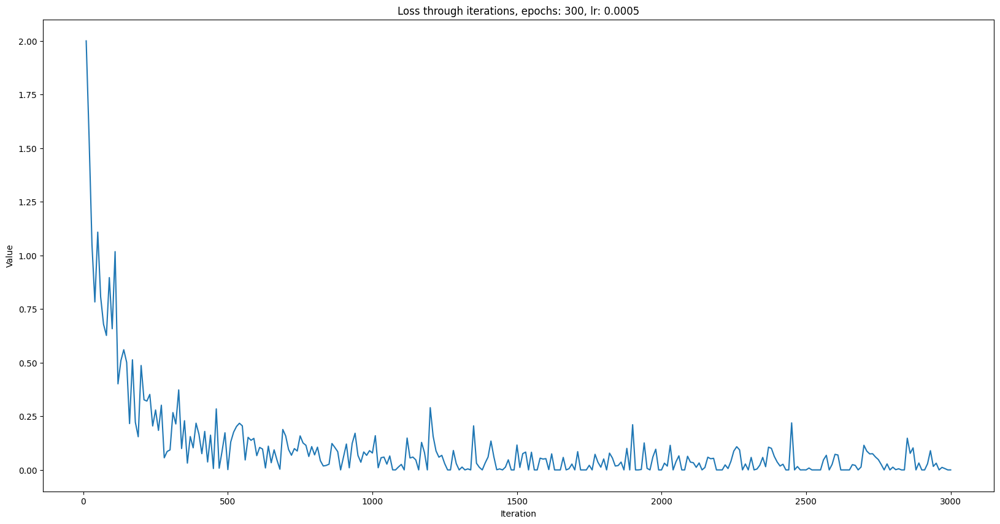

Epoch:   0%|          | 0/500 [00:00<?, ?it/s]

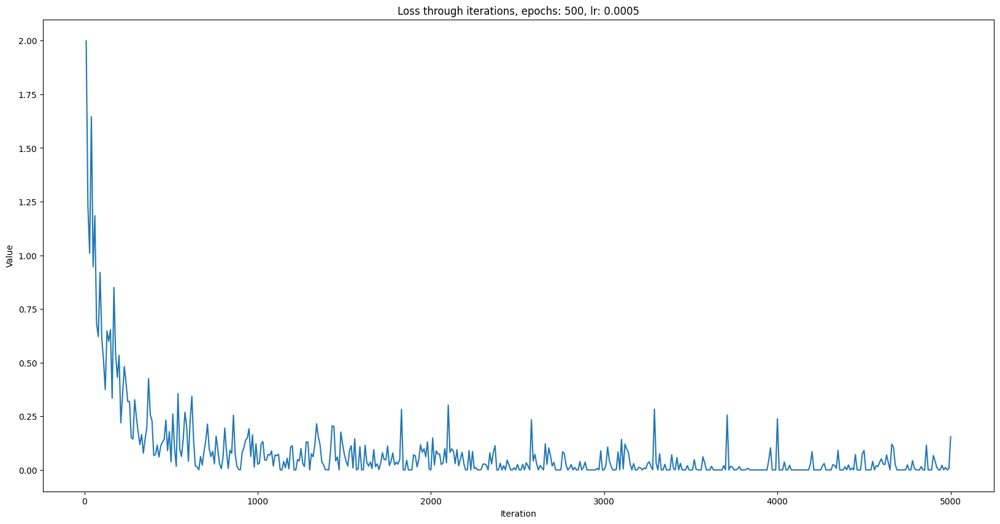

In [61]:
epochs_array = [2, 10, 20, 30, 50, 70, 100, 200, 300, 500]
model_array_epochs = [
    SiameseTripleNetwork().to(device) for i in range(len(epochs_array))
]

for idx, n_epochs in tqdm(
    enumerate(epochs_array),
    desc="N epochs analysis",
    total=len(epochs_array),
    colour="yellow",
):
    model_siamese = model_array_epochs[idx]
    criterion_f = ContrastiveTripleLoss()
    optimizer = optim.Adam(model_siamese.parameters(), lr=0.0005)
    fit_tri_siamese(
        model=model_siamese,
        criterion=criterion_f,
        optimizer=optimizer,
        train_dl=train_dataloader_triple,
        n_epochs=n_epochs,
        lr=0.0005,
        savefig=True,
        verbose=False,
    )

Model trained with epochs: 2


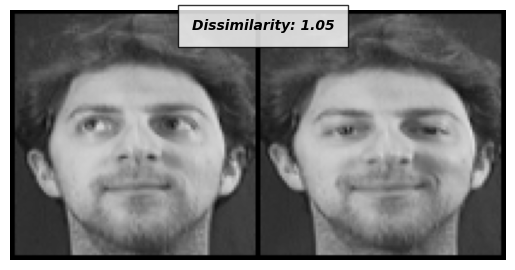

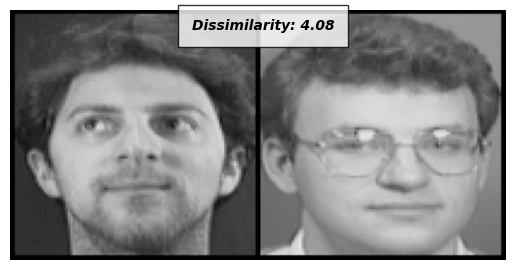

Model trained with epochs: 10


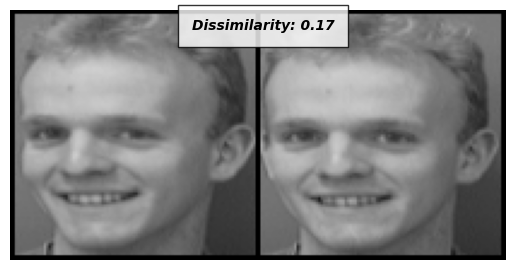

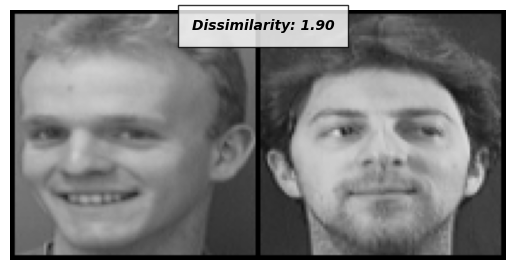

Model trained with epochs: 20


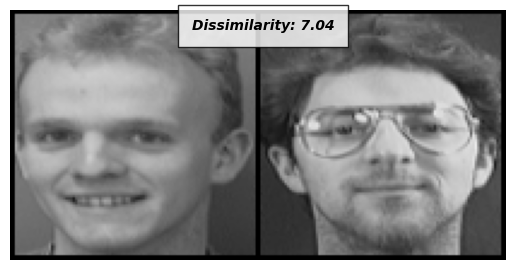

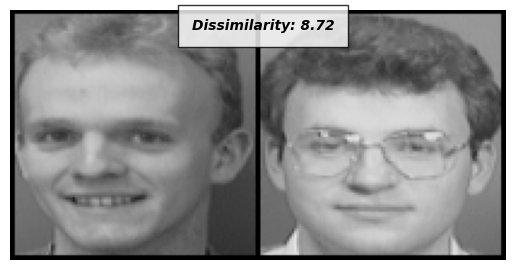

Model trained with epochs: 30


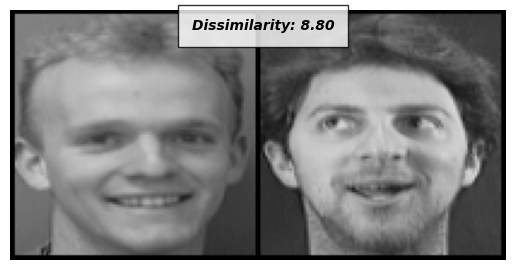

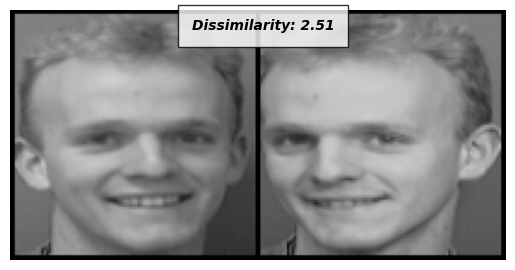

Model trained with epochs: 50


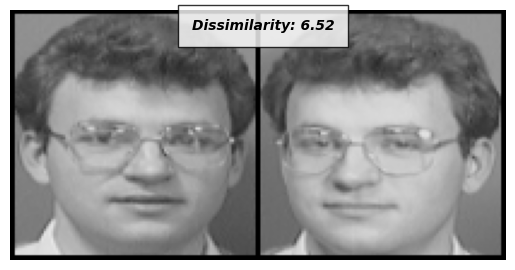

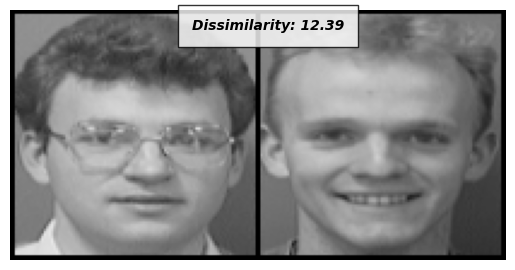

Model trained with epochs: 70


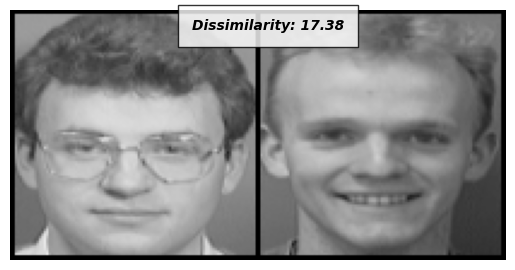

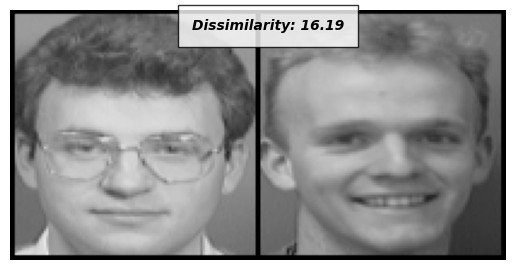

Model trained with epochs: 100


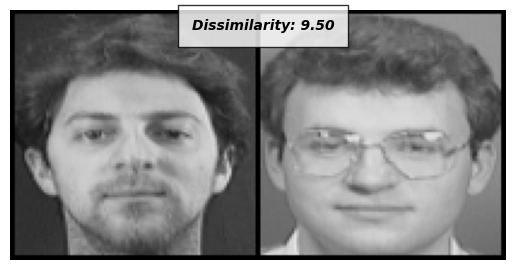

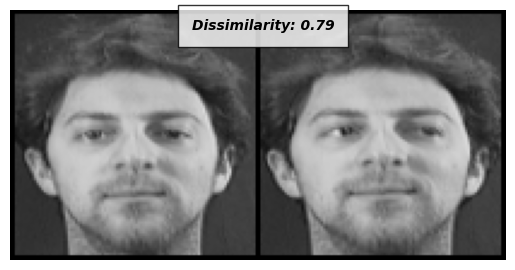

Model trained with epochs: 200


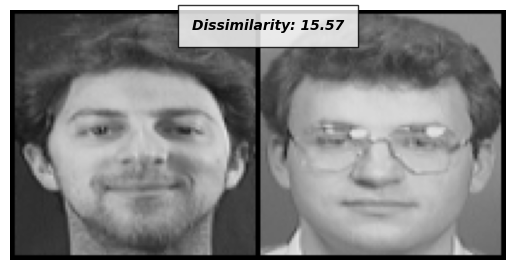

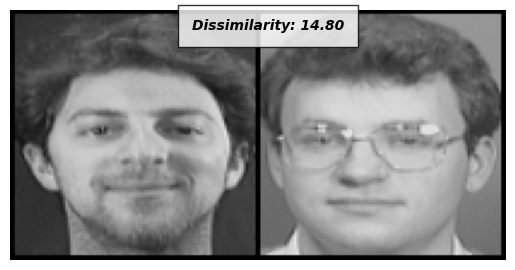

Model trained with epochs: 300


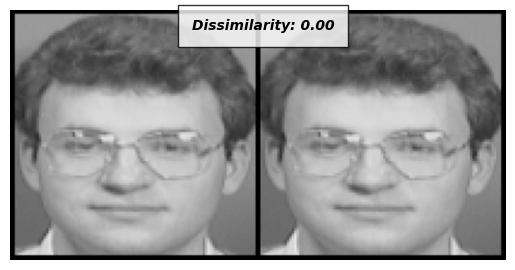

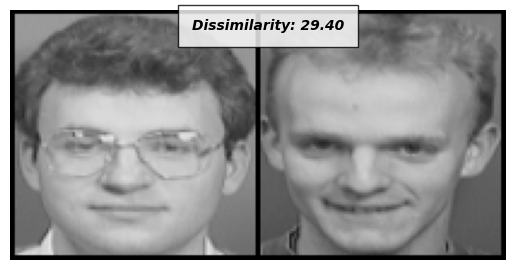

Model trained with epochs: 500


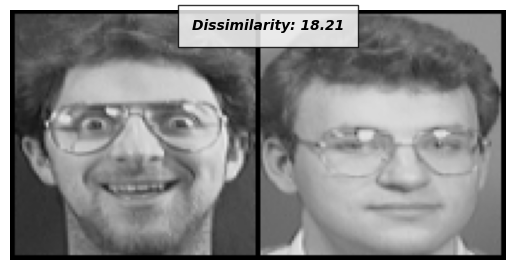

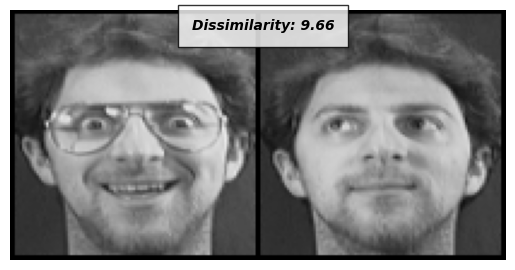

In [62]:
for idx, model in enumerate(model_array_epochs):
    print("================================================================")
    print(f"Model trained with epochs: {epochs_array[idx]}")
    model.eval()
    evaluate_according_to_first_img(model, n_compare_images=2)

# Modification of triple Siamese net

## Simplification

In [64]:
class SimplifiedSiameseTripleNetwork(nn.Module):
    def __init__(self):
        super(SimplifiedSiameseTripleNetwork, self).__init__()

        self.cnn1 = nn.Sequential(
            nn.Conv2d(1, 96, kernel_size=11, stride=4),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(3, stride=2),
            nn.Conv2d(96, 256, kernel_size=5, stride=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2, stride=2),
            nn.Conv2d(256, 384, kernel_size=3, stride=1),
            nn.ReLU(inplace=True),
        )

        self.fc1 = nn.Sequential(
            nn.Linear(384, 256),
            nn.ReLU(inplace=True),
            nn.Linear(256, 2),
        )

    def forward_once(self, x):
        # Funkcja zostanie wywołana osobno dla każdej próbki
        # Jej wyjście zostanie wykorzystane w celu określenia odległości
        output = self.cnn1(x)
        output = output.view(output.size()[0], -1)
        output = self.fc1(output)
        return output

    def forward(self, input_anchor, input_positive, input_negative):
        # Funkcja przyjmuje 3 próbki i zwraca 3 wektory
        output_anchor = self.forward_once(input_anchor)
        output_positive = self.forward_once(input_positive)
        output_negative = self.forward_once(input_negative)

        return output_anchor, output_positive, output_negative

Epoch:   0%|          | 0/200 [00:00<?, ?it/s]

Epoch number 0
 Current loss 1.998648762702942
Epoch number 1
 Current loss 1.4401488304138184

Epoch number 2
 Current loss 0.9740891456604004

Epoch number 3
 Current loss 1.34141206741333
Epoch number 4
 Current loss 1.0146385431289673

Epoch number 5
 Current loss 0.8077471256256104
Epoch number 6
 Current loss 0.7323652505874634

Epoch number 7
 Current loss 0.7790592908859253
Epoch number 8
 Current loss 0.6370449066162109
Epoch number 9
 Current loss 0.5212756395339966
Epoch number 10
 Current loss 0.8124475479125977
Epoch number 11
 Current loss 0.5425645112991333
Epoch number 12
 Current loss 0.3862733840942383
Epoch number 13
 Current loss 0.39592987298965454
Epoch number 14
 Current loss 0.4633004069328308
Epoch number 15
 Current loss 0.33535242080688477
Epoch number 16
 Current loss 0.4700571894645691
Epoch number 17
 Current loss 0.2180618941783905
Epoch number 18
 Current loss 0.3458917737007141
Epoch number 19
 Current loss 0.30224621295928955
Epoch number 20
 Current l

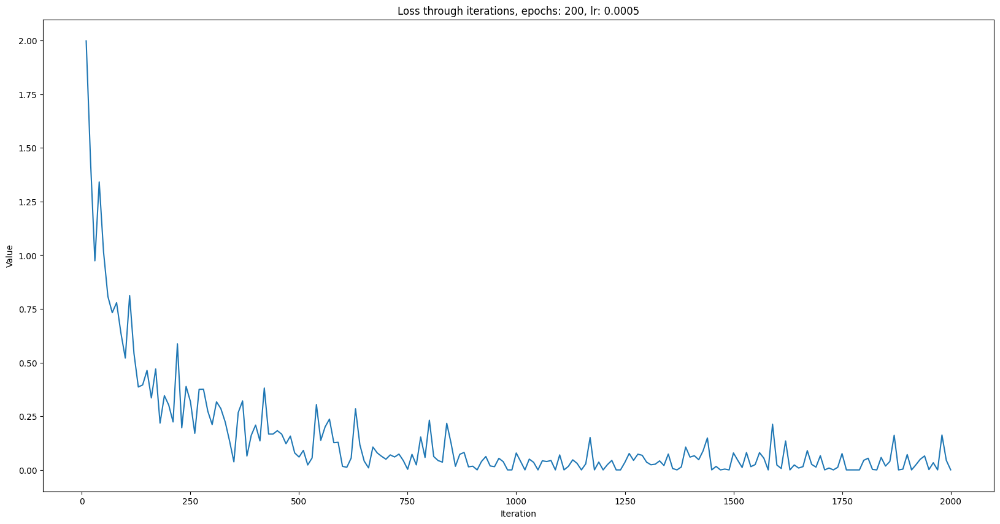

In [65]:
net_tri = SimplifiedSiameseTripleNetwork().to(device)
criterion_func = ContrastiveTripleLoss()
optimizer = optim.Adam(net_tri.parameters(), lr=0.0005)

fit_tri_siamese(
    model=net_tri,
    criterion=criterion_func,
    optimizer=optimizer,
    train_dl=train_dataloader_triple,
    n_epochs=200,
    lr=0.0005,
    savefig=False,
    verbose=True,
)

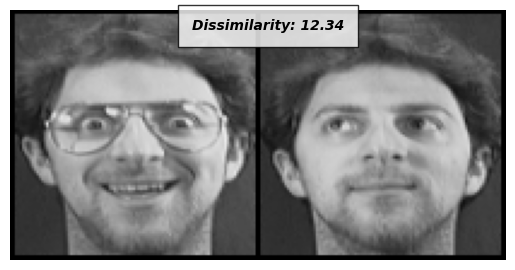

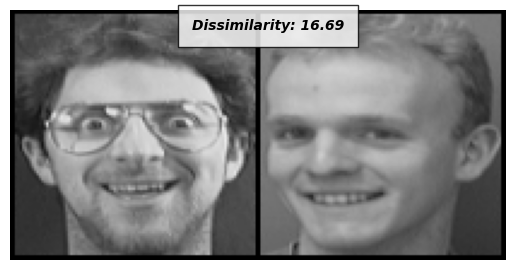

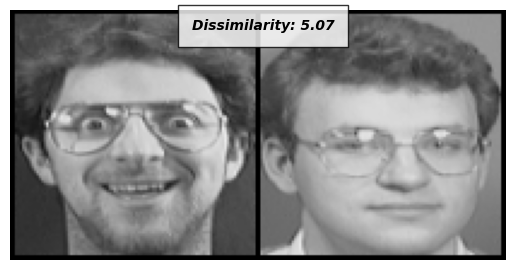

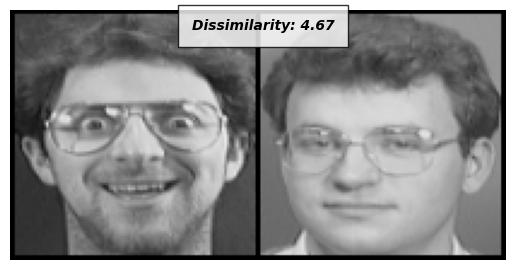

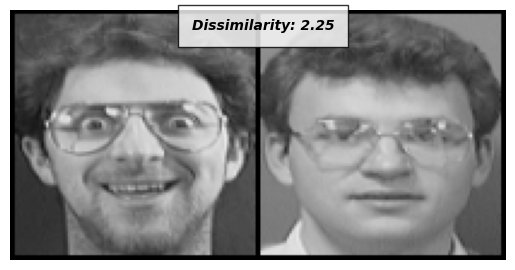

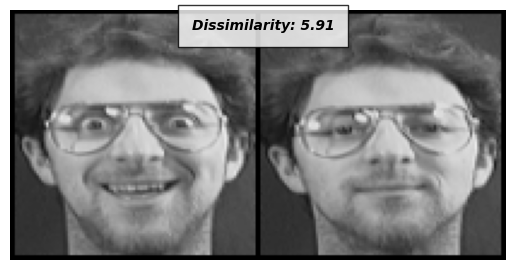

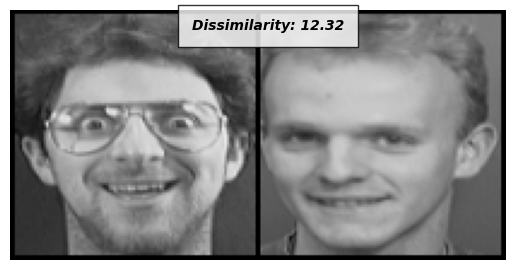

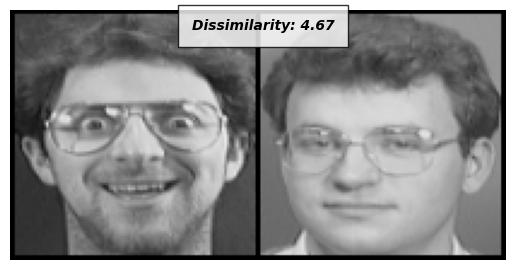

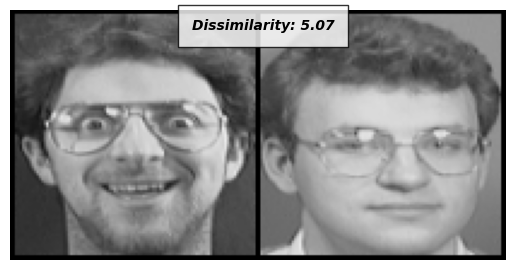

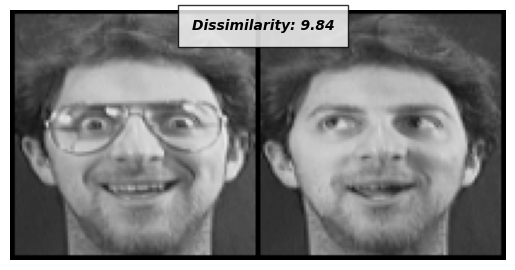

In [66]:
evaluate_according_to_first_img(net_tri, 10)

Epoch:   0%|          | 0/200 [00:00<?, ?it/s]

Epoch number 0
 Current loss 1.9995572566986084
Epoch number 1
 Current loss 1.4128704071044922
Epoch number 2
 Current loss 1.462204933166504
Epoch number 3
 Current loss 0.8620315790176392
Epoch number 4
 Current loss 0.8228757381439209
Epoch number 5
 Current loss 0.7123314142227173
Epoch number 6
 Current loss 1.09779691696167
Epoch number 7
 Current loss 0.7060863375663757
Epoch number 8
 Current loss 0.7532004117965698
Epoch number 9
 Current loss 0.7667785286903381
Epoch number 10
 Current loss 0.44741588830947876
Epoch number 11
 Current loss 0.6192700862884521
Epoch number 12
 Current loss 0.9493877291679382
Epoch number 13
 Current loss 0.7516220808029175
Epoch number 14
 Current loss 0.44604435563087463
Epoch number 15
 Current loss 0.23764337599277496
Epoch number 16
 Current loss 0.4630953073501587
Epoch number 17
 Current loss 0.6108559370040894
Epoch number 18
 Current loss 0.5007460117340088
Epoch number 19
 Current loss 0.5306288599967957
Epoch number 20
 Current loss 

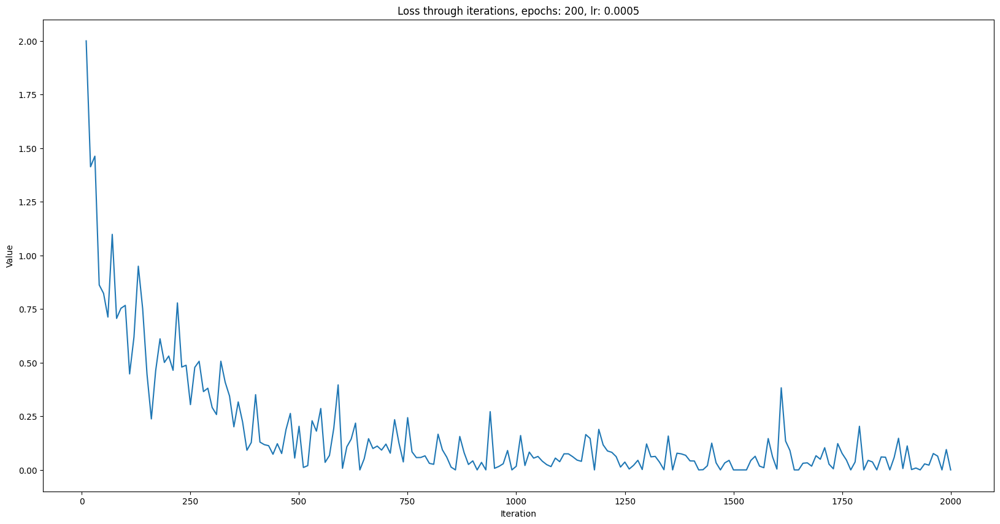

In [29]:
# TODO: można wziąć przedostatnią warstwę z NN sequential i zobaczyć to w tsne
net_tri = SiameseTripleNetwork().to(device)
criterion_func = ContrastiveTripleLoss()
optimizer = optim.Adam(net_tri.parameters(), lr=0.0005)

fit_tri_siamese(
    model=net_tri,
    criterion=criterion_func,
    optimizer=optimizer,
    train_dl=train_dataloader_triple,
    n_epochs=200,
    lr=0.0005,
    savefig=False,
    verbose=True,
)

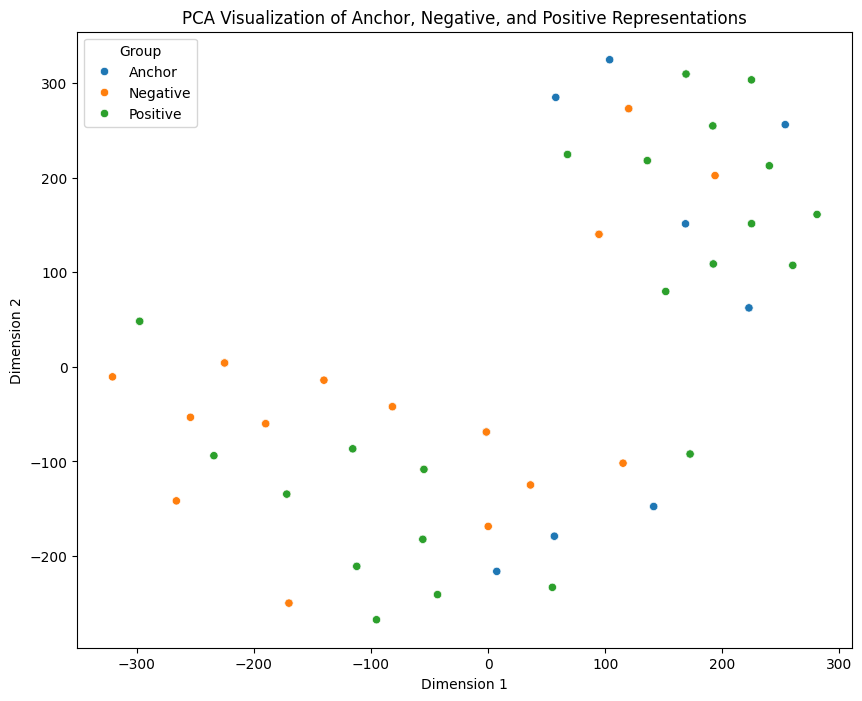

# Siamese VS Triple

Epoch:   0%|          | 0/100 [00:00<?, ?it/s]

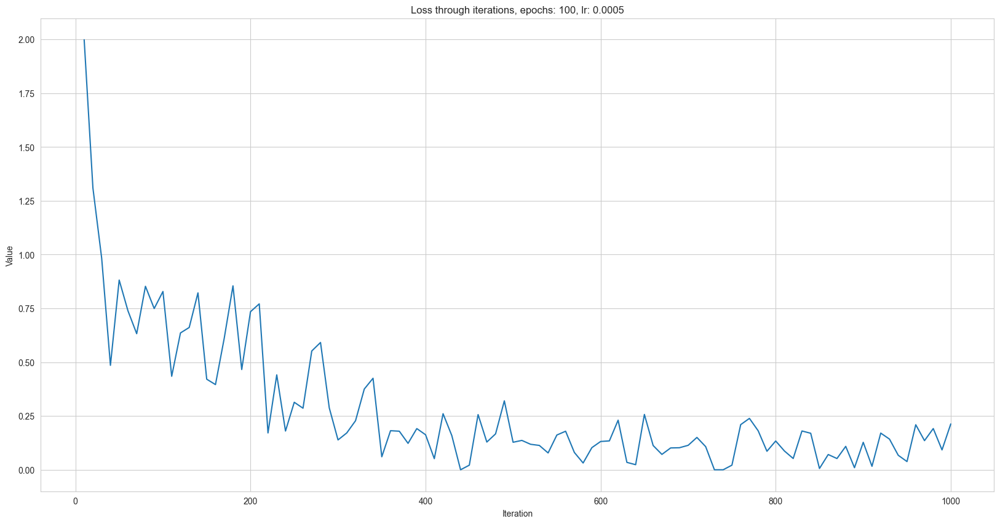

In [27]:
net_tri = SiameseTripleNetwork().to(device)
criterion_func = ContrastiveTripleLoss()
optimizer = optim.Adam(net_tri.parameters(), lr=0.0005)

fit_tri_siamese(
    model=net_tri,
    criterion=criterion_func,
    optimizer=optimizer,
    train_dl=train_dataloader_triple,
    n_epochs=100,
    lr=0.0005,
    savefig=False,
    verbose=False,
)

Epoch:   0%|          | 0/100 [00:00<?, ?it/s]

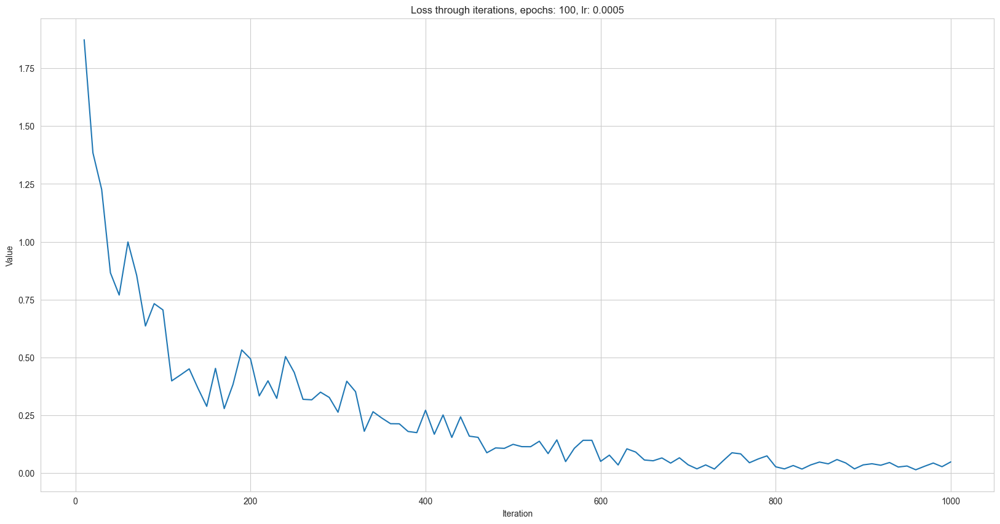

In [28]:
net_siamese = SiameseNetwork().to(device)
criterion_func_siamese = ContrastiveLoss()
optimizer = optim.Adam(net_siamese.parameters(), lr=0.0005)

fit(
    model=net_siamese,
    criterion=criterion_func_siamese,
    optimizer=optimizer,
    train_dl=train_dataloader,
    n_epochs=100,
    lr=0.0005,
    savefig=False,
    verbose=False,
)

In [29]:
folder_dataset = datasets.ImageFolder(
    root=f'{os.path.join(data_directory, "faces", "testing")}'
)

test_dataset_siamese = SiameseNetworkDataset(
    imageFolderDataset=folder_dataset, transform=transformation
)
test_dataset_tri = SiameseTripleNetworkDataset(
    imageFolderDataset=folder_dataset, transform=transformation
)

siamese_test_dataloader = DataLoader(test_dataset_siamese, shuffle=True, batch_size=64)
triplet_test_dataloader = DataLoader(test_dataset_tri, shuffle=True, batch_size=1)

In [30]:
net_siamese.eval()
net_tri.eval()

anchor, positive, negative = next(iter(triplet_test_dataloader))

In [61]:
anchor_repr_siamese, positive_repr_siamese = net_siamese(
    anchor.to(device), positive.to(device)
)
positive_distance_siamese = (
    F.pairwise_distance(anchor_repr_siamese, positive_repr_siamese).cpu().item()
)
anchor_repr_siamese, negative_repr_siamese = net_siamese(
    anchor.to(device), negative.to(device)
)
negative_distance_siamese = (
    F.pairwise_distance(anchor_repr_siamese, negative_repr_siamese).cpu().item()
)

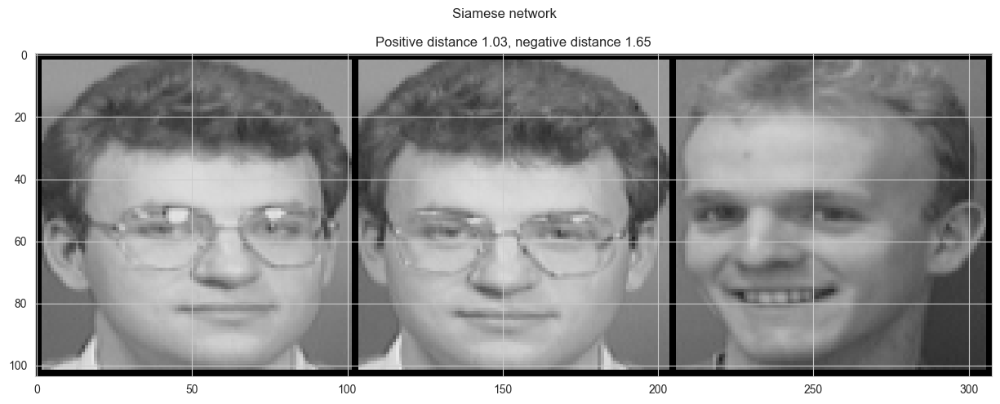

In [64]:
fig, ax = plt.subplots(figsize=(15, 5))
concatenated_siamese = torch.cat((anchor, positive, negative), 0)
fig.suptitle("Siamese network")
ax.imshow(torchvision.utils.make_grid(concatenated_siamese).permute(1, 2, 0))
ax.set_title(
    f"Positive distance {positive_distance_siamese:.2f}, negative distance {negative_distance_siamese:.2f}"
)
plt.tight_layout()
plt.show();

In [65]:
anchor_repr_tri, positive_repr_tri, negative_repr_tri = net_tri(
    anchor.to(device), positive.to(device), negative.to(device)
)
positive_distance_tri = (
    F.pairwise_distance(anchor_repr_tri, positive_repr_tri).cpu().item()
)
negative_distance_tri = (
    F.pairwise_distance(anchor_repr_tri, negative_repr_tri).cpu().item()
)

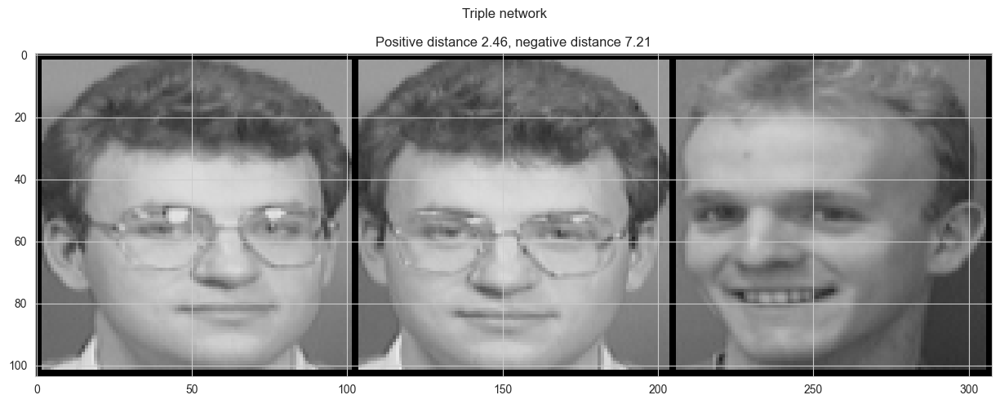

In [66]:
fig, ax = plt.subplots(figsize=(15, 5))
concatenated_siamese = torch.cat((anchor, positive, negative), 0)
fig.suptitle("Triple network")
ax.imshow(torchvision.utils.make_grid(concatenated_siamese).permute(1, 2, 0))
ax.set_title(
    f"Positive distance {positive_distance_tri:.2f}, negative distance {negative_distance_tri:.2f}"
)
plt.tight_layout()
plt.show();

# Net evaluation

In [31]:
triplet_test_dataloader = DataLoader(test_dataset_tri, shuffle=True, batch_size=32)

In [32]:
from sklearn.manifold import TSNE


def get_embeddings_siamese(model, dataloader):
    model.eval()
    embeddings = []
    with torch.no_grad():
        for anchor, _, _ in dataloader:
            anchor = anchor.to(device)
            emb = model.forward_once(anchor)
            embeddings.append(emb.cpu())
    return torch.cat(embeddings)


def get_embeddings_tri(model, dataloader, max_embeddings=None):
    model.eval()
    embeddings_anchor = []
    embeddings_positive = []
    embeddings_negative = []
    with torch.no_grad():
        for anchor, positive, negative in dataloader:
            if max_embeddings is not None:
                if len(embeddings_anchor) == max_embeddings:
                    print(embeddings_anchor)
                    break
                else:
                    embeddings_anchor.append(
                        model.forward_once(anchor.to(device)).cpu()
                    )
                    embeddings_positive.append(
                        model.forward_once(positive.to(device)).cpu()
                    )
                    embeddings_negative.append(
                        model.forward_once(negative.to(device)).cpu()
                    )

            else:
                embeddings_anchor.append(model.forward_once(anchor.to(device)).cpu())
                embeddings_positive.append(
                    model.forward_once(positive.to(device)).cpu()
                )
                embeddings_negative.append(
                    model.forward_once(negative.to(device)).cpu()
                )
    return (
        torch.cat(embeddings_anchor),
        torch.cat(embeddings_positive),
        torch.cat(embeddings_negative),
    )

In [33]:
emb_anchor, emb_positive, emb_negative = get_embeddings_tri(
    net_tri, triplet_test_dataloader
)

tsne = TSNE(n_components=2, perplexity=10, random_state=42)
tsne_anchor = tsne.fit_transform(emb_anchor)

tsne = TSNE(n_components=2, perplexity=10, random_state=42)
tsne_positive = tsne.fit_transform(emb_positive)

tsne = TSNE(n_components=2, perplexity=10, random_state=42)
tsne_negative = tsne.fit_transform(emb_negative)

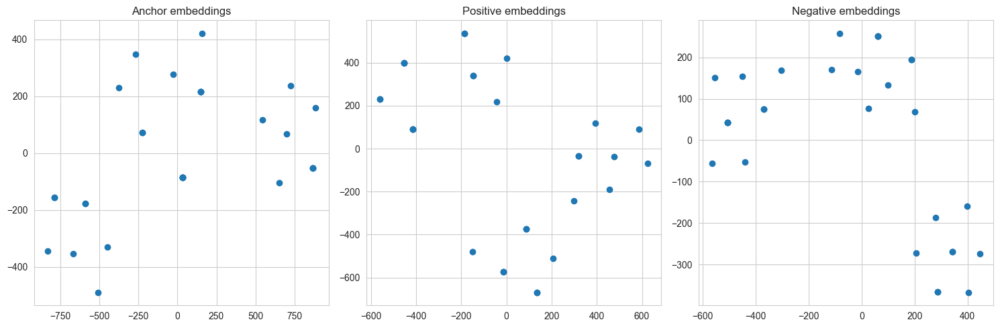

In [34]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 5))
ax1.scatter(tsne_anchor[:, 0], tsne_anchor[:, 1])
ax1.set_title("Anchor embeddings")

ax2.scatter(tsne_positive[:, 0], tsne_positive[:, 1])
ax2.set_title("Positive embeddings")

ax3.scatter(tsne_negative[:, 0], tsne_negative[:, 1])
ax3.set_title("Negative embeddings")

plt.tight_layout()
plt.show()

# Let's see how anchor, positive, negative embeddings are located in space

In [35]:
triplet_test_dataloader = DataLoader(test_dataset_tri, shuffle=True, batch_size=1)

emb_anchor, emb_positive, emb_negative = get_embeddings_tri(
    net_tri, triplet_test_dataloader
)
emb_anchor, emb_positive, emb_negative = (
    torch.mean(emb_anchor, dim=0).unsqueeze(dim=0),
    torch.mean(emb_positive, dim=0).unsqueeze(dim=0),
    torch.mean(emb_negative, dim=0).unsqueeze(dim=0),
)

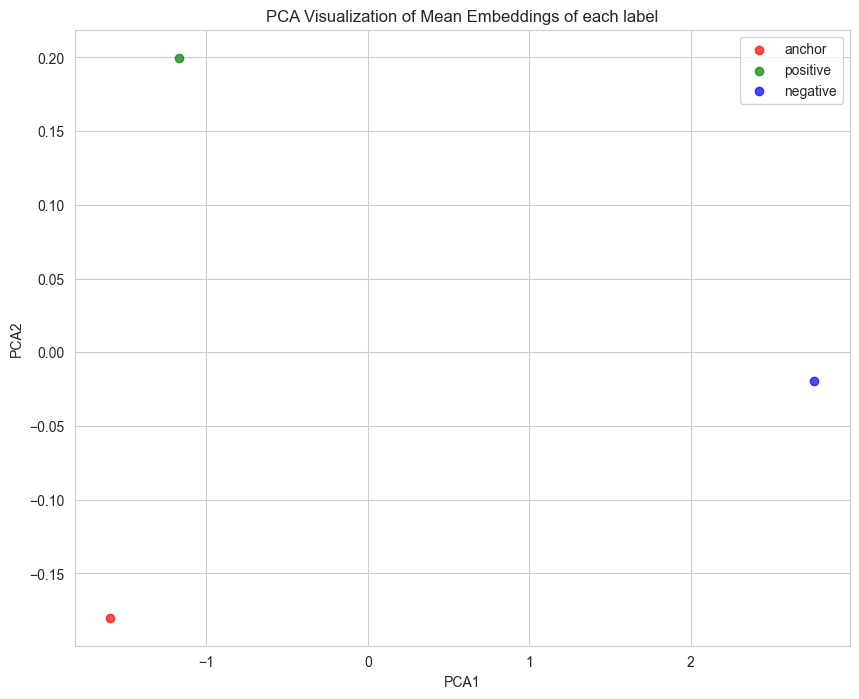

In [36]:
from sklearn.decomposition import PCA

all_embeddings = np.vstack([emb_anchor, emb_positive, emb_negative])
all_labels = np.hstack(
    [
        np.full(emb_anchor.shape[0], fill_value="anchor"),
        np.full(emb_positive.shape[0], fill_value="positive"),
        np.full(emb_negative.shape[0], fill_value="negative"),
    ]
)

# Apply PCA
pca = PCA(n_components=2)
pca_result = pca.fit_transform(all_embeddings)

import pandas as pd

df = pd.DataFrame(
    {"PCA1": pca_result[:, 0], "PCA2": pca_result[:, 1], "Label": all_labels}
)

# Plot the embeddings colored by labels
plt.figure(figsize=(10, 8))
colors = {"anchor": "red", "positive": "green", "negative": "blue"}
for label, color in colors.items():
    subset = df[df["Label"] == label]
    plt.scatter(subset["PCA1"], subset["PCA2"], c=color, label=label, alpha=0.7)

plt.title("PCA Visualization of Mean Embeddings of each label")
plt.xlabel("PCA1")
plt.ylabel("PCA2")
plt.legend()
plt.show()

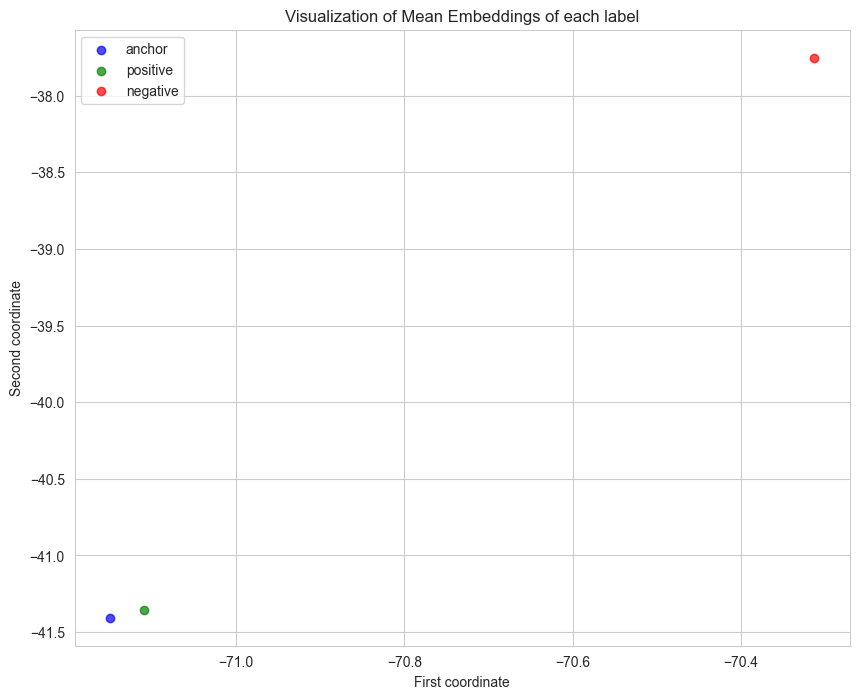

In [40]:
emb_anchor, emb_positive, emb_negative = get_embeddings_tri(
    net_tri, triplet_test_dataloader
)
emb_anchor, emb_positive, emb_negative = (
    torch.mean(emb_anchor, dim=0).unsqueeze(dim=0),
    torch.mean(emb_positive, dim=0).unsqueeze(dim=0),
    torch.mean(emb_negative, dim=0).unsqueeze(dim=0),
)
all_embeddings = np.vstack([emb_anchor, emb_positive, emb_negative])
all_labels = np.hstack(
    [
        np.full(emb_anchor.shape[0], fill_value="anchor"),
        np.full(emb_positive.shape[0], fill_value="positive"),
        np.full(emb_negative.shape[0], fill_value="negative"),
    ]
)

import pandas as pd

df = pd.DataFrame(
    {"First coordinate": all_embeddings[:, 0], "Second coordinate": all_embeddings[:, 1], "Label": all_labels}
)

# Plot the embeddings colored by labels
plt.figure(figsize=(10, 8))
colors = {"anchor": "blue", "positive": "green", "negative": "red"}
for label, color in colors.items():
    subset = df[df["Label"] == label]
    plt.scatter(subset["First coordinate"], subset["Second coordinate"], c=color, label=label, alpha=0.7)

plt.title("Visualization of Mean Embeddings of each label")
plt.xlabel("First coordinate")
plt.ylabel("Second coordinate")
plt.legend()
plt.show()

# Siamese network

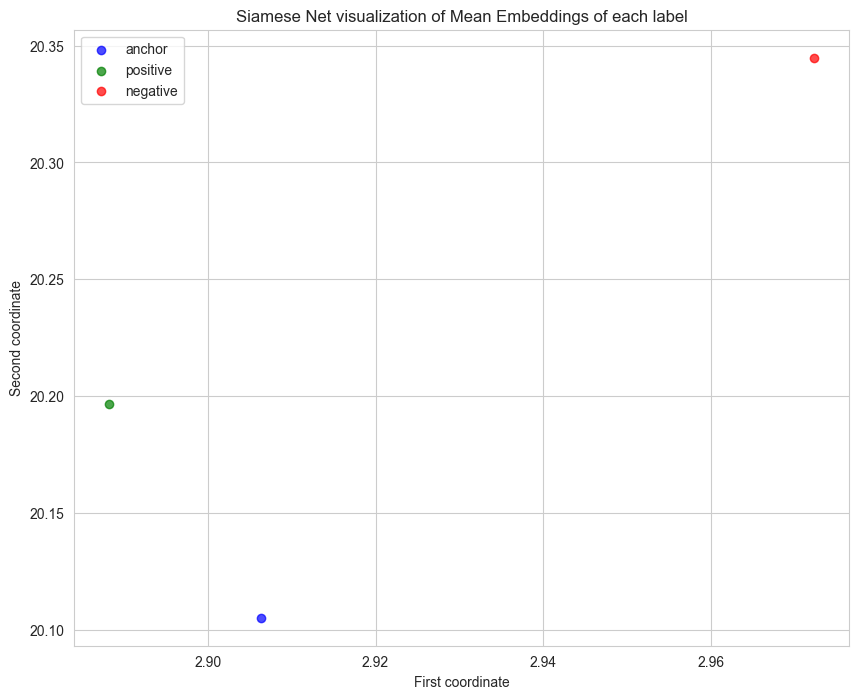

In [41]:
triplet_test_dataloader = DataLoader(test_dataset_tri, shuffle=True, batch_size=1)

emb_anchor, emb_positive, emb_negative = get_embeddings_tri(
    net_siamese, triplet_test_dataloader
)
emb_anchor, emb_positive, emb_negative = (
    torch.mean(emb_anchor, dim=0).unsqueeze(dim=0),
    torch.mean(emb_positive, dim=0).unsqueeze(dim=0),
    torch.mean(emb_negative, dim=0).unsqueeze(dim=0),
)

all_embeddings = np.vstack([emb_anchor, emb_positive, emb_negative])
all_labels = np.hstack(
    [
        np.full(emb_anchor.shape[0], fill_value="anchor"),
        np.full(emb_positive.shape[0], fill_value="positive"),
        np.full(emb_negative.shape[0], fill_value="negative"),
    ]
)

import pandas as pd

df = pd.DataFrame(
    {"First coordinate": all_embeddings[:, 0], "Second coordinate": all_embeddings[:, 1], "Label": all_labels}
)

# Plot the embeddings colored by labels
plt.figure(figsize=(10, 8))
colors = {"anchor": "blue", "positive": "green", "negative": "red"}
for label, color in colors.items():
    subset = df[df["Label"] == label]
    plt.scatter(subset["First coordinate"], subset["Second coordinate"], c=color, label=label, alpha=0.7)

plt.title("Siamese Net visualization of Mean Embeddings of each label")
plt.xlabel("First coordinate")
plt.ylabel("Second coordinate")
plt.legend()
plt.show()